# Data analysis and making some machine learning models based on our data simulation.


In [2]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score, confusion_matrix
import seaborn as sns
from matplotlib import animation
from collections import defaultdict
from IPython.display import HTML
import warnings
warnings.filterwarnings('ignore')  # To suppress warnings for cleaner output


In [3]:
boid = pd.read_csv("data/boid_simulation_data.csv", dtype={'boid_id': 'int',
                                                               'color': 'str',
                                                               'flock_id': 'int', 
                                                               'frame': 'int', 
                                                               'vx': 'float64', 
                                                               'vy': 'float64',
                                                               'x': 'float64', 
                                                               'y': 'float64'}
                  )
boid

,boid_id,color,flock_id,frame,vx,vy,x,y
0,0,#49f871,1,0,-2.479296,-1.872206,441.981190,187.451964
1,1,#49f871,1,0,2.156851,0.299435,384.181278,288.242743
2,2,#49f871,1,0,-0.327745,-1.049485,35.906992,554.799059
3,3,#49f871,1,0,0.911347,-0.963919,327.154862,109.142391
4,4,#49f871,1,0,-0.006484,-2.783329,303.159654,254.981777
...,...,...,...,...,...,...,...,...
79255,55,#ff4242,2,79200,3.159127,-0.341481,114.346783,248.681377
79256,56,#ff4242,2,79200,-3.879315,-0.691244,573.518754,462.200174
79257,57,#ff4242,2,79200,-1.872679,-1.931037,185.860924,127.434943
79258,58,#ff4242,2,79200,2.726588,-0.967235,162.913284,226.695808


In [4]:
boid['frame'] = boid['frame'] / 60
boid

,boid_id,color,flock_id,frame,vx,vy,x,y
0,0,#49f871,1,0.0,-2.479296,-1.872206,441.981190,187.451964
1,1,#49f871,1,0.0,2.156851,0.299435,384.181278,288.242743
2,2,#49f871,1,0.0,-0.327745,-1.049485,35.906992,554.799059
3,3,#49f871,1,0.0,0.911347,-0.963919,327.154862,109.142391
4,4,#49f871,1,0.0,-0.006484,-2.783329,303.159654,254.981777
...,...,...,...,...,...,...,...,...
79255,55,#ff4242,2,1320.0,3.159127,-0.341481,114.346783,248.681377
79256,56,#ff4242,2,1320.0,-3.879315,-0.691244,573.518754,462.200174
79257,57,#ff4242,2,1320.0,-1.872679,-1.931037,185.860924,127.434943
79258,58,#ff4242,2,1320.0,2.726588,-0.967235,162.913284,226.695808


In [5]:
from sklearn.cluster import KMeans
import numpy as np

# Determine the number of unique flocks
num_flocks = boid['flock_id'].nunique()
print("Number of unique flocks:", num_flocks)


Number of unique flocks: 2


In [6]:
from collections import defaultdict

# Initialize a dictionary to store K-Means labels per frame
kmeans_labels_per_frame = defaultdict(list)

# Initialize K-Means with the determined number of clusters
kmeans = KMeans(n_clusters=num_flocks, random_state=42)

# Get a sorted list of unique frames
frames = sorted(boid['frame'].unique())

# Initialize a list to collect DataFrames
kmeans_dfs = []

# Iterate through each frame and perform K-Means
for frame in frames:
    frame_data = boid[boid['frame'] == frame]
    positions = frame_data[['x', 'y']].values
    
    # Fit K-Means
    kmeans.fit(positions)
    
    # Store the labels
    labels = kmeans.labels_
    kmeans_labels_per_frame[frame] = labels
    
    # Create a temporary DataFrame for the current frame
    temp_df = pd.DataFrame({
        'frame': frame,
        'boid_id': frame_data['boid_id'].values,
        'kmeans_cluster': labels
    })
    
    # Append the temporary DataFrame to the list
    kmeans_dfs.append(temp_df)
    
    # Optional: Print progress every 100 frames to monitor
   # if frame % 100 == 0:
     #   print("Processed frame:", frame)

# Concatenate all temporary DataFrames into a single DataFrame
kmeans_df = pd.concat(kmeans_dfs, ignore_index=True)

# Merge K-Means labels with the original data
boid_with_kmeans = pd.merge(boid, kmeans_df, on=['frame', 'boid_id'])

# Display the merged data
print(boid_with_kmeans.head())

   boid_id    color  flock_id  frame        vx        vy           x  \
0        0  #49f871         1    0.0 -2.479296 -1.872206  441.981190   
1        1  #49f871         1    0.0  2.156851  0.299435  384.181278   
2        2  #49f871         1    0.0 -0.327745 -1.049485   35.906992   
3        3  #49f871         1    0.0  0.911347 -0.963919  327.154862   
4        4  #49f871         1    0.0 -0.006484 -2.783329  303.159654   

            y  kmeans_cluster  
0  187.451964               1  
1  288.242743               1  
2  554.799059               0  
3  109.142391               1  
4  254.981777               0  


In [7]:
from sklearn.metrics import confusion_matrix
from scipy.optimize import linear_sum_assignment

# Function to map K-Means clusters to actual flock IDs
def map_clusters_to_labels(true_labels, predicted_labels):
    # Compute confusion matrix
    cm = confusion_matrix(true_labels, predicted_labels)
    
    # Apply Hungarian Algorithm to find the best mapping
    row_ind, col_ind = linear_sum_assignment(-cm)  # Maximize the matches
    
    # Create a mapping from cluster to flock_id
    mapping = {}
    for row, col in zip(row_ind, col_ind):
        mapping[col] = row  # cluster_label -> flock_id
    
    return mapping

# Initialize a list to store mapped labels
mapped_kmeans_clusters = []

# Iterate through each frame and map clusters
for frame in frames:
    frame_data = boid_with_kmeans[boid_with_kmeans['frame'] == frame]
    true_labels = frame_data['flock_id'].values
    predicted_labels = frame_data['kmeans_cluster'].values
    
    # Get unique labels
    unique_true = np.unique(true_labels)
    unique_pred = np.unique(predicted_labels)
    
    # Create mapping
    mapping = map_clusters_to_labels(true_labels, predicted_labels)
    
    # Map predicted labels to actual labels
    mapped_labels = [mapping[label] for label in predicted_labels]
    
    mapped_kmeans_clusters.extend(mapped_labels)
    
    # Optional: Print progress every 100 frames
#    if frame % 100 == 0:
  #      print("Mapped clusters for frame:", frame)

# Add the mapped K-Means clusters to the DataFrame
boid_with_kmeans['mapped_kmeans_cluster'] = mapped_kmeans_clusters

# Display the updated DataFrame
boid_with_kmeans.head()


,boid_id,color,flock_id,frame,vx,vy,x,y,kmeans_cluster,mapped_kmeans_cluster
0,0,#49f871,1,0.0,-2.479296,-1.872206,441.981190,187.451964,1,1
1,1,#49f871,1,0.0,2.156851,0.299435,384.181278,288.242743,1,1
2,2,#49f871,1,0.0,-0.327745,-1.049485,35.906992,554.799059,0,2
3,3,#49f871,1,0.0,0.911347,-0.963919,327.154862,109.142391,1,1
4,4,#49f871,1,0.0,-0.006484,-2.783329,303.159654,254.981777,0,2


In [8]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# Extract true labels and predicted K-Means cluster labels
true_labels = boid_with_kmeans['flock_id'].values
predicted_labels = boid_with_kmeans['kmeans_cluster'].values

# Calculate Adjusted Rand Index (ARI)
ari = adjusted_rand_score(true_labels, predicted_labels)
print("Adjusted Rand Index (ARI): {:.4f}".format(ari))

# Calculate Normalized Mutual Information (NMI)
nmi = normalized_mutual_info_score(true_labels, predicted_labels)
print("Normalized Mutual Information (NMI): {:.4f}".format(nmi))


Adjusted Rand Index (ARI): 0.0965
Normalized Mutual Information (NMI): 0.0708


In [9]:
from sklearn.metrics import confusion_matrix
from scipy.optimize import linear_sum_assignment

def map_clusters_to_flocks(true_labels, predicted_labels):
    # Compute the confusion matrix
    cm = confusion_matrix(true_labels, predicted_labels)
    
    # Apply the Hungarian Algorithm to find the optimal one-to-one mapping
    row_ind, col_ind = linear_sum_assignment(-cm)  # Negative for maximizing
    
    # Create a mapping from predicted cluster to true flock_id
    mapping = {pred: true for pred, true in zip(col_ind, row_ind)}
    
    return mapping

# Get the optimal mapping
mapping = map_clusters_to_flocks(true_labels, predicted_labels)

# Map the predicted labels to the true flock_ids
mapped_predicted_labels = [mapping[label] for label in predicted_labels]

# Calculate accuracy after mapping
from sklearn.metrics import accuracy_score
accuracy = accuracy_score(true_labels, mapped_predicted_labels)
print("Clustering Accuracy after Mapping: {:.2f}%".format(accuracy * 100))


Clustering Accuracy after Mapping: 65.53%


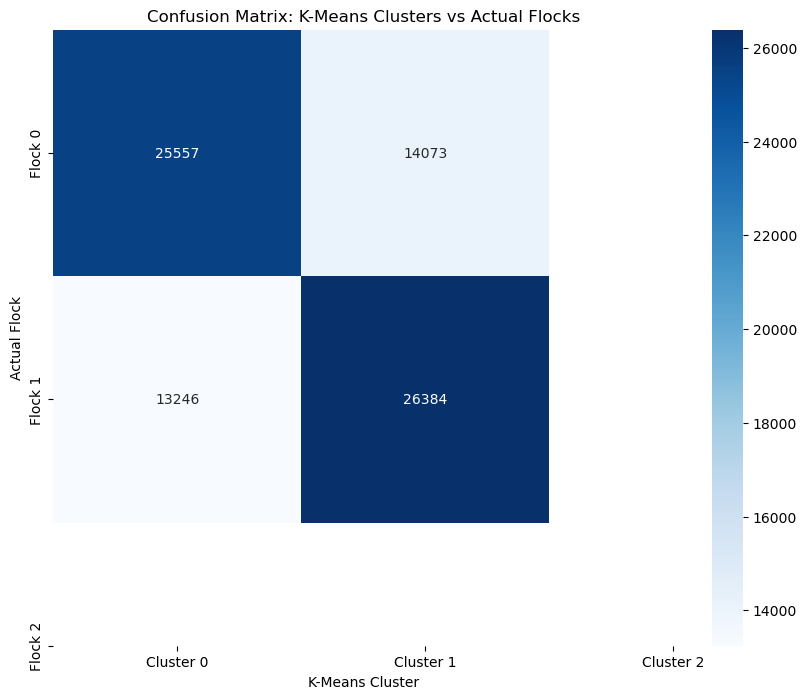

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute the confusion matrix with optimal mapping
cm = confusion_matrix(true_labels, mapped_predicted_labels)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=[f'Cluster {c}' for c in sorted(mapping.keys())],
            yticklabels=[f'Flock {f}' for f in sorted(mapping.values())])
plt.xlabel('K-Means Cluster')
plt.ylabel('Actual Flock')
plt.title('Confusion Matrix: K-Means Clusters vs Actual Flocks')
plt.show()


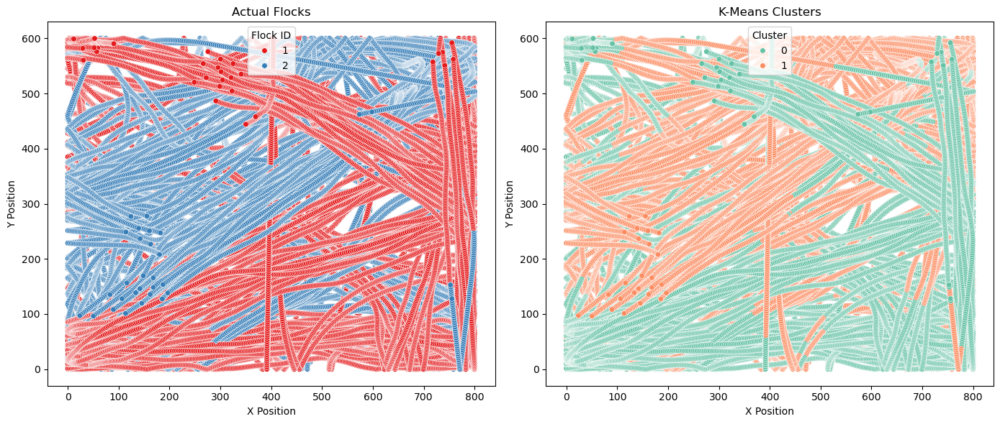

In [11]:
plt.figure(figsize=(14, 6))

# Actual Flocks
plt.subplot(1, 2, 1)
sns.scatterplot(data=boid_with_kmeans, x='x', y='y', hue='flock_id',
                palette='Set1', s=30, edgecolor='w')
plt.title('Actual Flocks')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.legend(title='Flock ID')

# K-Means Clusters
plt.subplot(1, 2, 2)
sns.scatterplot(data=boid_with_kmeans, x='x', y='y', hue='kmeans_cluster',
                palette='Set2', s=30, edgecolor='w')
plt.title('K-Means Clusters')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.legend(title='Cluster')

plt.tight_layout()
plt.show()


In [12]:
# Select features for clustering
features = ['x', 'y', 'vx', 'vy']
X = boid[features].values


In [13]:
# Check for missing values
print(boid[features].isnull().sum())


x     0
y     0
vx    0
vy    0
dtype: int64


In [14]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()

# Fit and transform the data
X_scaled = scaler.fit_transform(X)


In [15]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt



In [16]:
# Determine the number of unique flocks
num_flocks = boid['flock_id'].nunique()
print("\nNumber of unique flocks:", num_flocks)



Number of unique flocks: 2


In [17]:
# Initialize a dictionary to store K-Means labels per frame
kmeans_labels_per_frame = defaultdict(list)

# Initialize K-Means with the determined number of clusters
kmeans = KMeans(n_clusters=num_flocks, random_state=42)

# Get a sorted list of unique frames
frames = sorted(boid['frame'].unique())
print("\nTotal number of frames:", len(frames))

# Initialize a list to collect DataFrames
kmeans_dfs = []

# Iterate through each frame and perform K-Means
for frame in frames:
    frame_data = boid[boid['frame'] == frame]
    positions = frame_data[['x', 'y', 'vx', 'vy']].values
    
    # Edge Case Handling: Ensure number of boids >= number of clusters
    if len(frame_data) < num_flocks:
        print(f"Skipping frame {frame}: Not enough boids ({len(frame_data)}) for {num_flocks} clusters")
        continue
    
    # Fit K-Means
    try:
        kmeans.fit(positions)
        labels = kmeans.labels_
    except Exception as e:
        print(f"Error in K-Means for frame {frame}: {e}")
        continue  # Skip frames where K-Means fails
    
    # Store the labels
    kmeans_labels_per_frame[frame] = labels
    
    # Create a temporary DataFrame for the current frame
    temp_df = pd.DataFrame({
        'frame': frame,
        'boid_id': frame_data['boid_id'].values,
        'kmeans_cluster': labels
    })
    
    # Append the temporary DataFrame to the list
    kmeans_dfs.append(temp_df)
    



Total number of frames: 1321


In [18]:
# Check if any frames were processed
if not kmeans_dfs:
    raise ValueError("No frames were processed. Check data integrity.")

# Concatenate all temporary DataFrames into a single DataFrame
kmeans_df = pd.concat(kmeans_dfs, ignore_index=True)

# Merge K-Means labels with the original data
boid_with_kmeans = pd.merge(boid, kmeans_df, on=['frame', 'boid_id'])

# Display the merged data
print("\nMerged DataFrame with K-Means Labels:")
print(boid_with_kmeans.head())



Merged DataFrame with K-Means Labels:
   boid_id    color  flock_id  frame        vx        vy           x  \
0        0  #49f871         1    0.0 -2.479296 -1.872206  441.981190   
1        1  #49f871         1    0.0  2.156851  0.299435  384.181278   
2        2  #49f871         1    0.0 -0.327745 -1.049485   35.906992   
3        3  #49f871         1    0.0  0.911347 -0.963919  327.154862   
4        4  #49f871         1    0.0 -0.006484 -2.783329  303.159654   

            y  kmeans_cluster  
0  187.451964               1  
1  288.242743               1  
2  554.799059               0  
3  109.142391               1  
4  254.981777               0  


In [19]:
# Function to map K-Means clusters to actual flock IDs
def map_clusters_to_labels(true_labels, predicted_labels):
    # Compute confusion matrix
    cm = confusion_matrix(true_labels, predicted_labels)
    
    # Apply Hungarian Algorithm to find the best mapping
    row_ind, col_ind = linear_sum_assignment(-cm)  # Maximize the matches
    
    # Create a mapping from cluster to flock_id
    mapping = {}
    for row, col in zip(row_ind, col_ind):
        mapping[col] = row  # cluster_label -> flock_id
    
    return mapping

# Initialize a list to store mapped labels
mapped_kmeans_clusters = []

# Iterate through each frame and map clusters
for frame in frames:
    frame_data = boid_with_kmeans[boid_with_kmeans['frame'] == frame]
    true_labels = frame_data['flock_id'].values
    predicted_labels = frame_data['kmeans_cluster'].values
    
    # Calculate ARI and NMI for the frame
    ari = adjusted_rand_score(true_labels, predicted_labels)
    nmi = normalized_mutual_info_score(true_labels, predicted_labels)
    
    # Get the optimal mapping
    mapping = map_clusters_to_labels(true_labels, predicted_labels)
    
    # Map predicted labels to actual labels
    mapped_labels = [mapping[label] for label in predicted_labels]
    
    mapped_kmeans_clusters.extend(mapped_labels)
    
    # Optional: Print progress every 100 frames to monitor
 #   if frame % 100 == 0:
  #      print(f"Mapped clusters for frame: {frame}")


In [20]:
from sklearn.metrics import accuracy_score

# Add the mapped K-Means clusters to the DataFrame
boid_with_kmeans['mapped_kmeans_cluster'] = mapped_kmeans_clusters

# Extract true labels and mapped K-Means cluster labels
true_labels_all = boid_with_kmeans['flock_id'].values
mapped_labels_all = boid_with_kmeans['mapped_kmeans_cluster'].values

# Calculate overall accuracy
accuracy = accuracy_score(true_labels_all, mapped_labels_all)
print(f"\nOverall Clustering Accuracy: {accuracy * 100:.2f}%")



Overall Clustering Accuracy: 66.82%


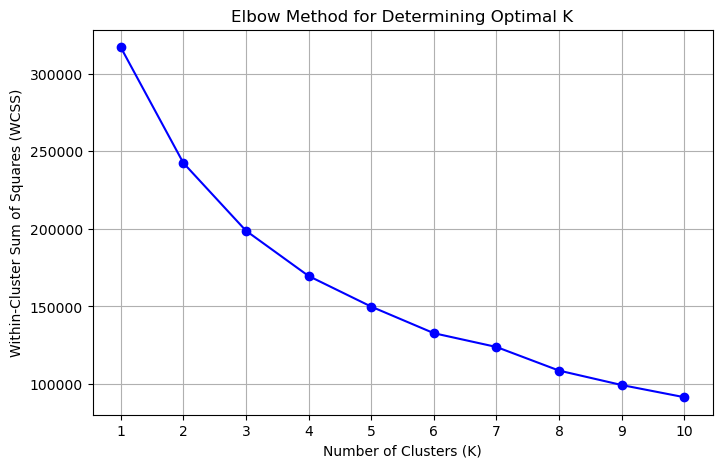

In [21]:
# Determine the range for K
K_range = range(1, 11)
WCSS = []

for K in K_range:
    kmeans = KMeans(n_clusters=K, random_state=42)
    kmeans.fit(X_scaled)
    WCSS.append(kmeans.inertia_)  # Sum of squared distances to closest cluster center

# Plot the Elbow Curve
plt.figure(figsize=(8, 5))
plt.plot(K_range, WCSS, 'bo-')
plt.title('Elbow Method for Determining Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.xticks(K_range)
plt.grid(True)
plt.show()


In [22]:
# Calculate Adjusted Rand Index (ARI)
ari = adjusted_rand_score(true_labels_all, boid_with_kmeans['kmeans_cluster'].values)
print(f"Overall Adjusted Rand Index (ARI): {ari:.4f}")


Overall Adjusted Rand Index (ARI): 0.0968


In [23]:
# Calculate Normalized Mutual Information (NMI)
nmi = normalized_mutual_info_score(true_labels_all, boid_with_kmeans['kmeans_cluster'].values)
print(f"Overall Normalized Mutual Information (NMI): {nmi:.4f}")


Overall Normalized Mutual Information (NMI): 0.0711


In [24]:
# Initialize lists to store per-frame metrics
per_frame_metrics = []

for frame in frames:
    frame_data = boid_with_kmeans[boid_with_kmeans['frame'] == frame]
    if frame_data.empty:
        continue
    
    true_labels = frame_data['flock_id'].values
    mapped_labels = frame_data['mapped_kmeans_cluster'].values
    predicted_labels = frame_data['kmeans_cluster'].values
    
    # Calculate metrics
    acc = accuracy_score(true_labels, mapped_labels)
    ari = adjusted_rand_score(true_labels, predicted_labels)
    nmi = normalized_mutual_info_score(true_labels, predicted_labels)
    
    # Append to the list
    per_frame_metrics.append({
        'frame': frame,
        'accuracy': acc,
        'ARI': ari,
        'NMI': nmi
    })
    
    # Optional: Print progress every 100 frames
 #   if frame % 100 == 0:
 #       print(f"Calculated metrics for frame: {frame}")

# Convert to DataFrame
metrics_df = pd.DataFrame(per_frame_metrics)

# Display the first few rows
print("\nPer-Frame Clustering Metrics:")
print(metrics_df.head())



Per-Frame Clustering Metrics:
   frame  accuracy       ARI       NMI
0    0.0  0.566667  0.001532  0.013604
1    1.0  0.566667  0.001532  0.013604
2    2.0  0.566667  0.001532  0.013604
3    3.0  0.566667  0.001532  0.013604
4    4.0  0.566667  0.001532  0.013604


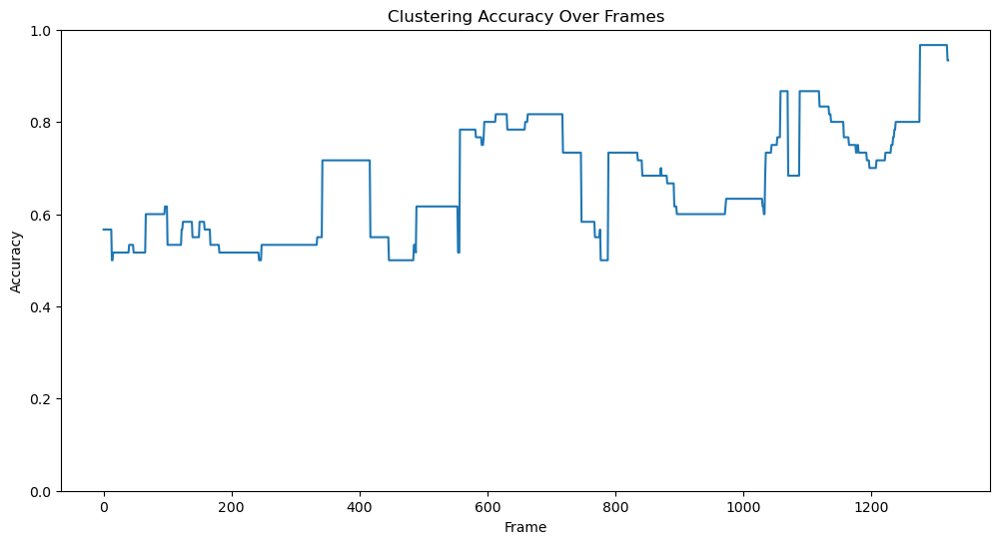

In [25]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=metrics_df, x='frame', y='accuracy')
plt.title('Clustering Accuracy Over Frames')
plt.xlabel('Frame')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.show()


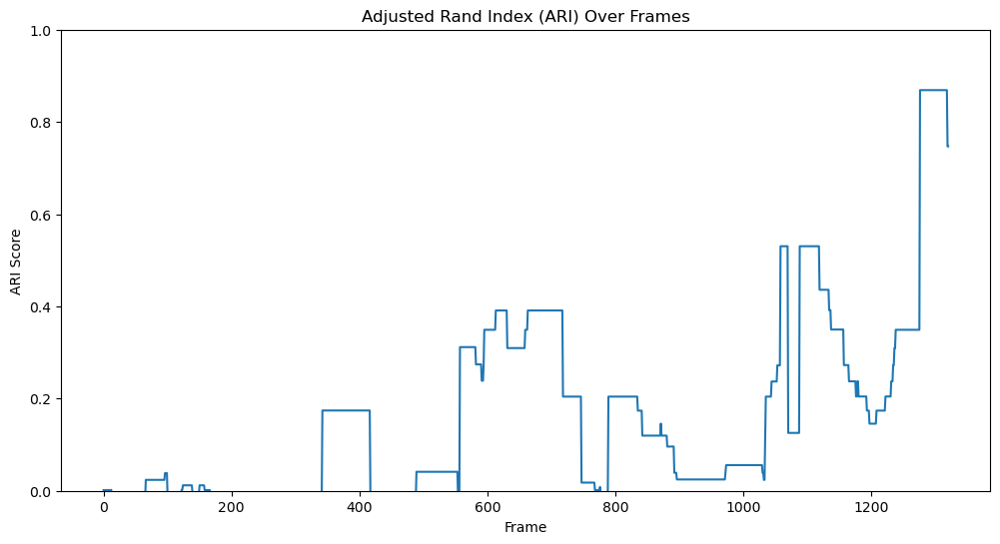

In [26]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=metrics_df, x='frame', y='ARI')
plt.title('Adjusted Rand Index (ARI) Over Frames')
plt.xlabel('Frame')
plt.ylabel('ARI Score')
plt.ylim(0, 1)
plt.show()


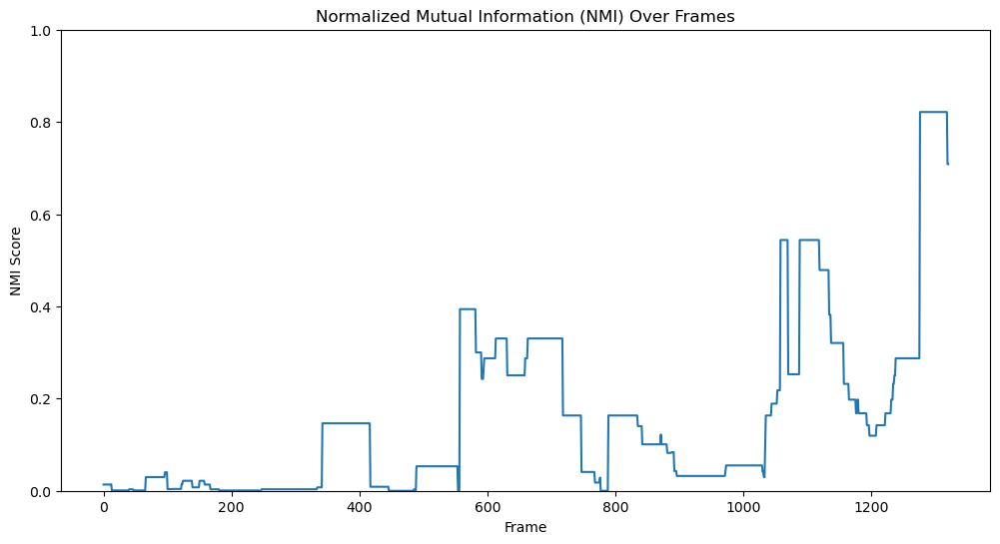

In [27]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=metrics_df, x='frame', y='NMI')
plt.title('Normalized Mutual Information (NMI) Over Frames')
plt.xlabel('Frame')
plt.ylabel('NMI Score')
plt.ylim(0, 1)
plt.show()


For n_clusters = 2, the average silhouette_score is : 0.24
For n_clusters = 3, the average silhouette_score is : 0.23
For n_clusters = 4, the average silhouette_score is : 0.24
For n_clusters = 5, the average silhouette_score is : 0.24
For n_clusters = 6, the average silhouette_score is : 0.25
For n_clusters = 7, the average silhouette_score is : 0.24
For n_clusters = 8, the average silhouette_score is : 0.26
For n_clusters = 9, the average silhouette_score is : 0.27
For n_clusters = 10, the average silhouette_score is : 0.27


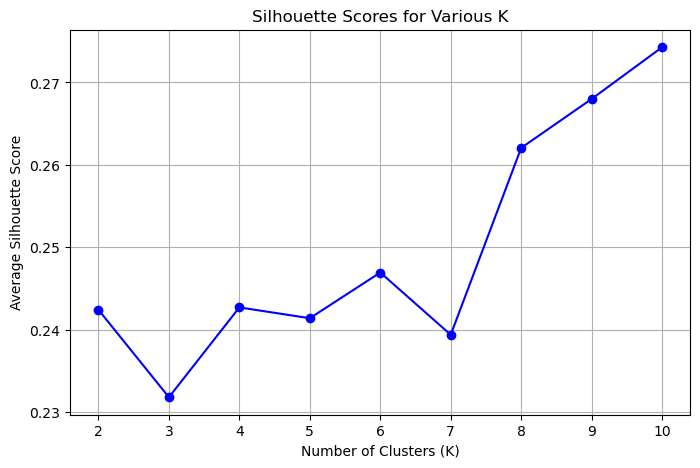

In [28]:
from sklearn.metrics import silhouette_score

silhouette_scores = []

for K in range(2, 11):
    kmeans = KMeans(n_clusters=K, random_state=42)
    cluster_labels = kmeans.fit_predict(X_scaled)
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    print("For n_clusters = {}, the average silhouette_score is : {:.2f}".format(K, silhouette_avg))

# Plot Silhouette Scores
plt.figure(figsize=(8, 5))
plt.plot(range(2, 11), silhouette_scores, 'bo-')
plt.title('Silhouette Scores for Various K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Average Silhouette Score')
plt.xticks(range(2, 11))
plt.grid(True)
plt.show()


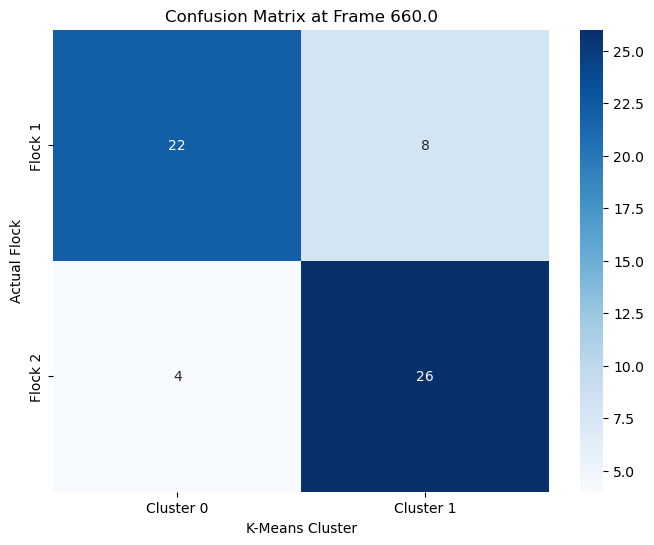

In [29]:
# Select a specific frame to visualize
selected_frame = frames[len(frames) // 2]  # Middle frame as an example
frame_data = boid_with_kmeans[boid_with_kmeans['frame'] == selected_frame]

# True labels and K-Means labels
true_labels = frame_data['flock_id'].values
mapped_labels = frame_data['mapped_kmeans_cluster'].values

# Compute confusion matrix
cm = confusion_matrix(true_labels, mapped_labels)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=[f'Cluster {c}' for c in sorted(boid_with_kmeans["kmeans_cluster"].unique())],
            yticklabels=[f'Flock {f}' for f in sorted(boid_with_kmeans["flock_id"].unique())])
plt.xlabel('K-Means Cluster')
plt.ylabel('Actual Flock')
plt.title(f'Confusion Matrix at Frame {selected_frame}')
plt.show()


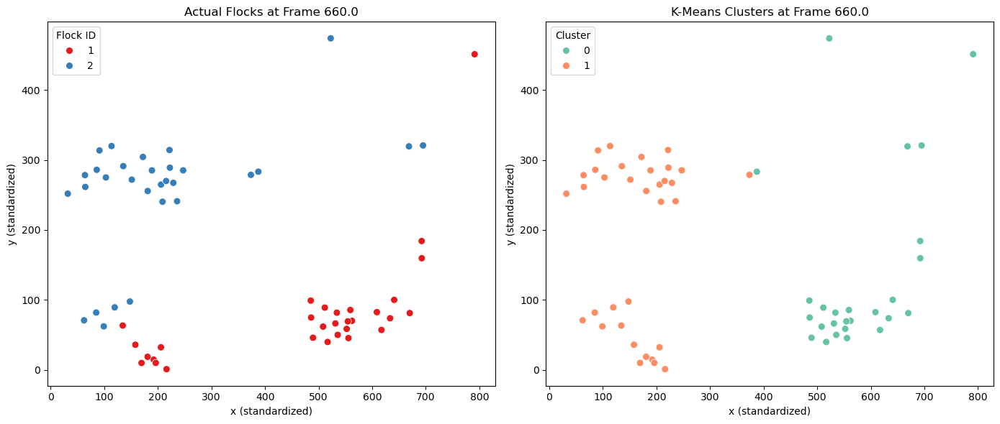

In [30]:
plt.figure(figsize=(14, 6))

# Actual Flocks
plt.subplot(1, 2, 1)
sns.scatterplot(data=frame_data, x='x', y='y', hue='flock_id',
                palette='Set1', s=50, edgecolor='w')
plt.title(f'Actual Flocks at Frame {selected_frame}')
plt.xlabel('x (standardized)')
plt.ylabel('y (standardized)')
plt.legend(title='Flock ID')

# K-Means Clusters
plt.subplot(1, 2, 2)
sns.scatterplot(data=frame_data, x='x', y='y', hue='kmeans_cluster',
                palette='Set2', s=50, edgecolor='w')
plt.title(f'K-Means Clusters at Frame {selected_frame}')
plt.xlabel('x (standardized)')
plt.ylabel('y (standardized)')
plt.legend(title='Cluster')

plt.tight_layout()
plt.show()



Frame Data Info:
<class 'pandas.core.frame.DataFrame'>
Index: 60 entries, 39600 to 39659
Data columns (total 10 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   boid_id                60 non-null     int32  
 1   color                  60 non-null     object 
 2   flock_id               60 non-null     int32  
 3   frame                  60 non-null     float64
 4   vx                     60 non-null     float64
 5   vy                     60 non-null     float64
 6   x                      60 non-null     float64
 7   y                      60 non-null     float64
 8   kmeans_cluster         60 non-null     int32  
 9   mapped_kmeans_cluster  60 non-null     int64  
dtypes: float64(5), int32(3), int64(1), object(1)
memory usage: 4.5+ KB
None

Frame Data Description:
         boid_id   flock_id  frame         vx         vy           x  \
count  60.000000  60.000000   60.0  60.000000  60.000000   60.000000   
mean   

NameError: name 'kmeans_marker_map' is not defined

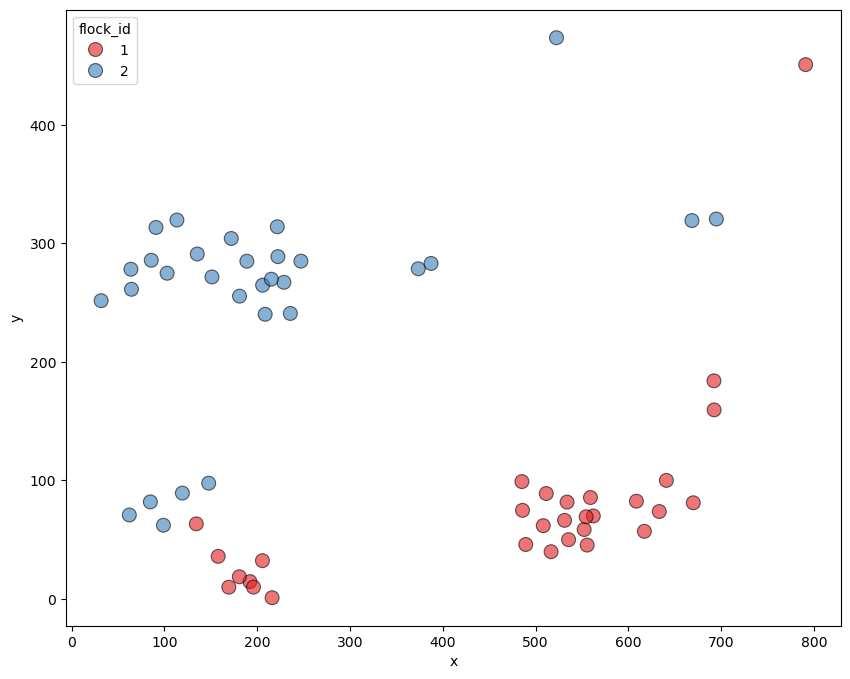

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select a specific frame to visualize
selected_frame = frames[len(frames) // 2]  # Middle frame as an example
frame_data = boid_with_kmeans[boid_with_kmeans['frame'] == selected_frame]

# Verify data integrity
print("\nFrame Data Info:")
print(frame_data.info())

print("\nFrame Data Description:")
print(frame_data.describe())

plt.figure(figsize=(10, 8))

# Plot actual flocks without the 'label' parameter
sns_plot = sns.scatterplot(data=frame_data, x='x', y='y', hue='flock_id',
                           palette='Set1', s=100, edgecolor='k', alpha=0.6)

# Plot K-Means clusters with different markers
cluster_handles = []
unique_clusters = sorted(frame_data['kmeans_cluster'].unique())
for cluster in unique_clusters:
    cluster_data = frame_data[frame_data['kmeans_cluster'] == cluster]
    if cluster_data.empty:
        continue
    scatter = plt.scatter(cluster_data['x'], cluster_data['y'],
                          marker=kmeans_marker_map[cluster],
                          edgecolors='w', s=100, label=f'Cluster {cluster}')
    cluster_handles.append(scatter)

plt.title(f'Boid Simulation: Frame {selected_frame} - Actual Flocks vs K-Means Clusters')
plt.xlabel('x (standardized)')
plt.ylabel('y (standardized)')

# Get Seaborn handles and labels
handles, labels = sns_plot.get_legend_handles_labels()
handles = handles[1:]  # Remove the first handle if it's redundant

# Append cluster handles and labels
handles += cluster_handles
labels += [f'Cluster {cluster}' for cluster in unique_clusters]

plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [32]:
# Define the number of clusters
optimal_K = 3  # Replace with the determined optimal K

# Initialize KMeans
kmeans = KMeans(n_clusters=optimal_K, random_state=42)

# Fit KMeans on the scaled data
kmeans.fit(X_scaled)

# Predict cluster labels
clusters = kmeans.predict(X_scaled)

# Add cluster labels to the DataFrame
boid['KMeans_Cluster'] = clusters


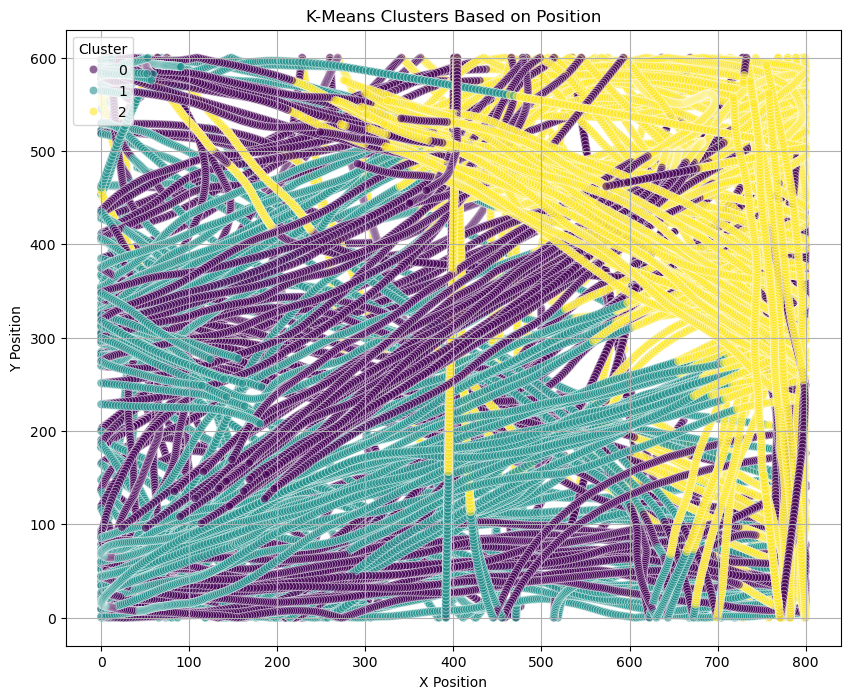

In [33]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x='x', y='y', hue='KMeans_Cluster', data=boid, palette='viridis', alpha=0.6)
plt.title('K-Means Clusters Based on Position')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


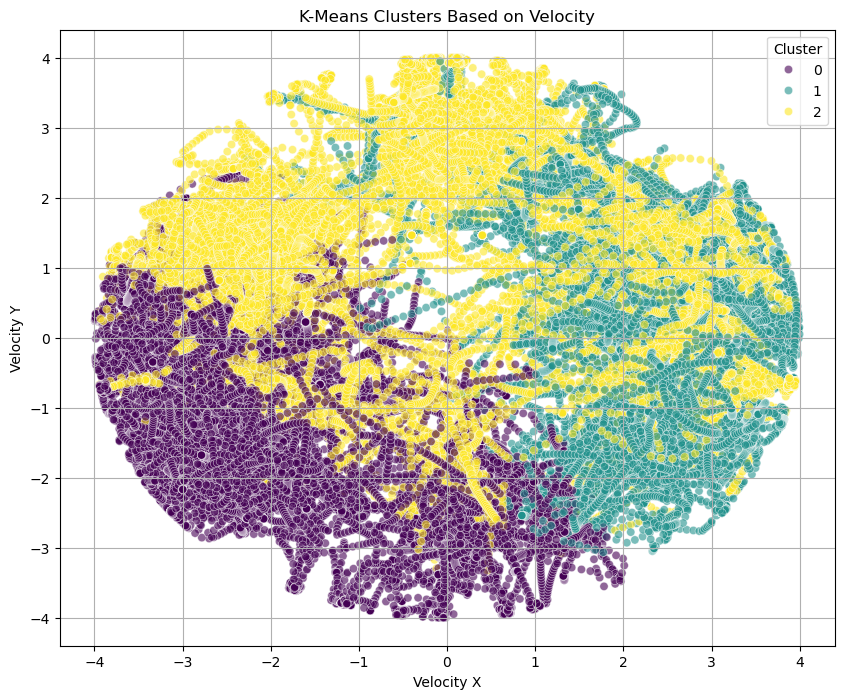

In [34]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x='vx', y='vy', hue='KMeans_Cluster', data=boid, palette='viridis', alpha=0.6)
plt.title('K-Means Clusters Based on Velocity')
plt.xlabel('Velocity X')
plt.ylabel('Velocity Y')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


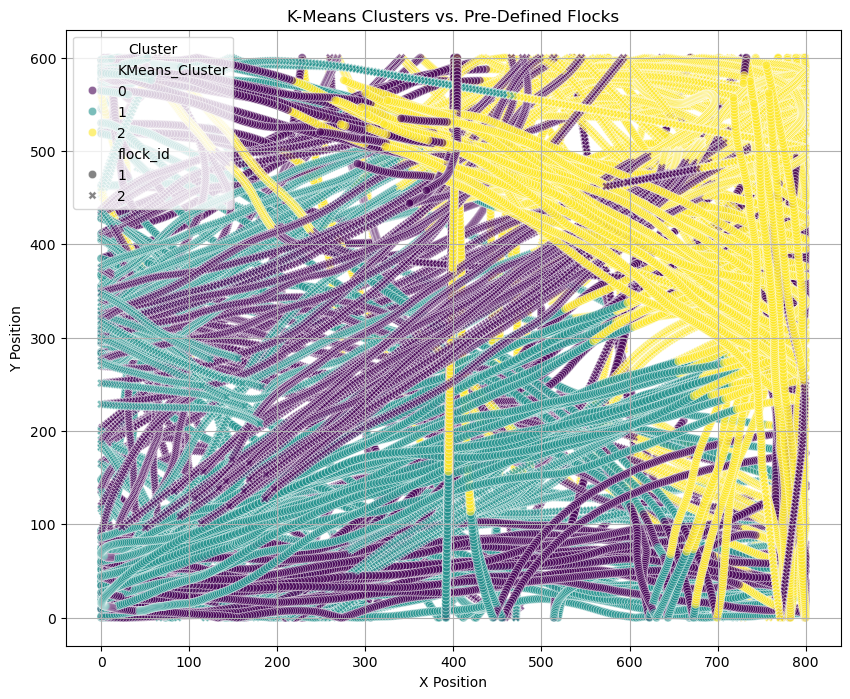

In [35]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x='x', y='y', hue='KMeans_Cluster', style='flock_id', data=boid, palette='viridis', alpha=0.6)
plt.title('K-Means Clusters vs. Pre-Defined Flocks')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


In [36]:
# Cross-tabulation of KMeans clusters and pre-defined flocks
crosstab = pd.crosstab(boid['KMeans_Cluster'], boid['flock_id'])
print(crosstab)


flock_id            1      2
KMeans_Cluster              
0               13985  16426
1               12893  11065
2               12752  12139


In [37]:
# Retrieve cluster centroids in scaled space
centroids_scaled = kmeans.cluster_centers_

# Convert centroids back to original scale
centroids = scaler.inverse_transform(centroids_scaled)

# Create a DataFrame for centroids
centroids_df = pd.DataFrame(centroids, columns=features)
centroids_df['Cluster'] = range(optimal_K)

print(centroids_df)


            x           y        vx        vy  Cluster
0  343.961272  262.889520 -2.045158 -1.014680        0
1  302.934145  197.382372  2.417215  0.352569        1
2  634.481770  416.469370 -0.170267  1.113203        2


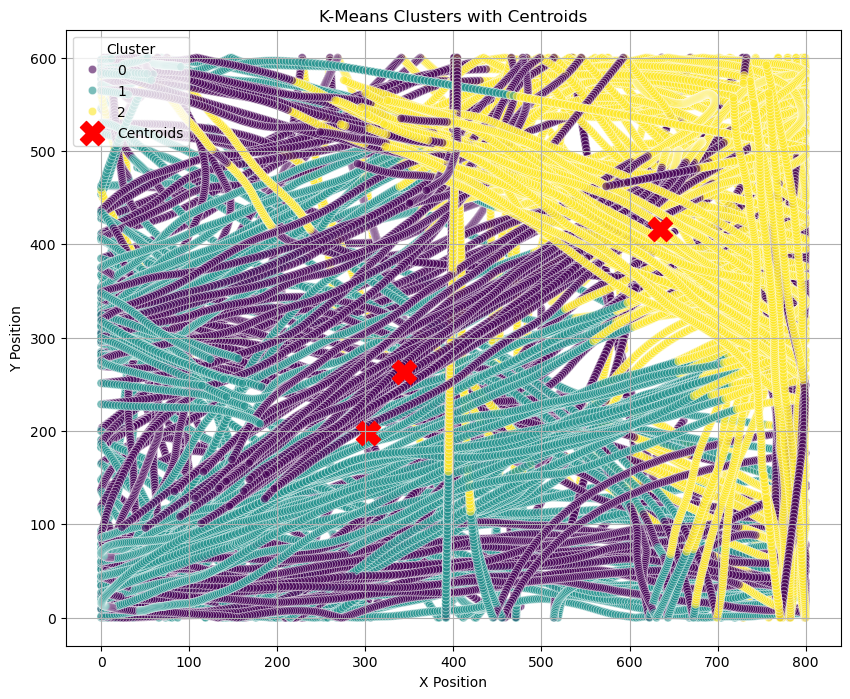

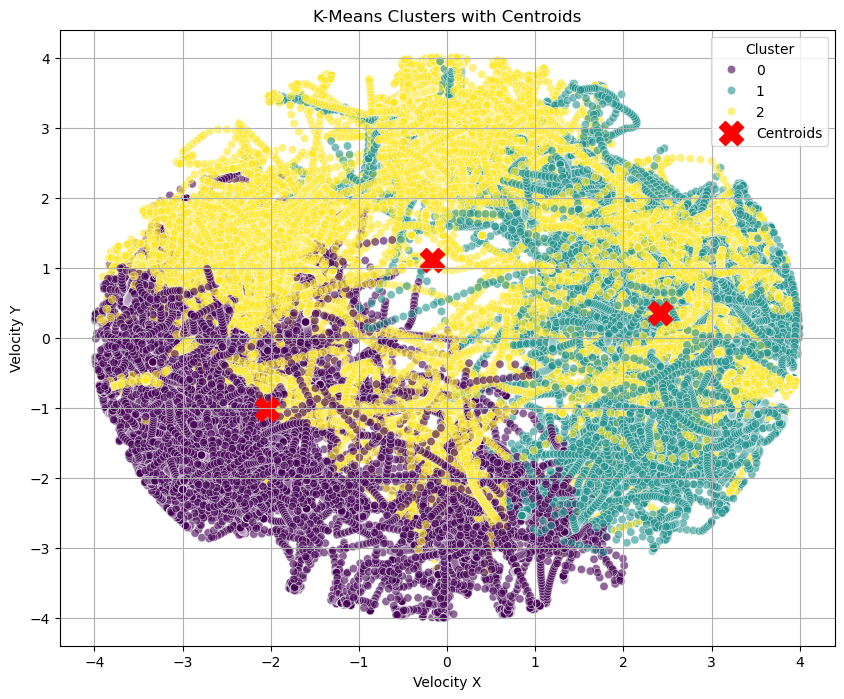

In [38]:
# Position Centroids
plt.figure(figsize=(10, 8))
sns.scatterplot(x='x', y='y', hue='KMeans_Cluster', data=boid, palette='viridis', alpha=0.6)
plt.scatter(centroids_df['x'], centroids_df['y'], s=300, c='red', marker='X', label='Centroids')
plt.title('K-Means Clusters with Centroids')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()

# Velocity Centroids
plt.figure(figsize=(10, 8))
sns.scatterplot(x='vx', y='vy', hue='KMeans_Cluster', data=boid, palette='viridis', alpha=0.6)
plt.scatter(centroids_df['vx'], centroids_df['vy'], s=300, c='red', marker='X', label='Centroids')
plt.title('K-Means Clusters with Centroids')
plt.xlabel('Velocity X')
plt.ylabel('Velocity Y')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


In [39]:
boid['speed'] = np.sqrt(boid['vx']**2 + boid['vy']**2)
features = ['x', 'y', 'vx', 'vy', 'speed']
X = boid[features].values


In [40]:
# Calculate speed and direction
boid['speed'] = np.sqrt(boid['vx']**2 + boid['vy']**2)
boid['direction'] = np.arctan2(boid['vy'], boid['vx'])

# Update feature list
features = ['x', 'y', 'vx', 'vy', 'speed', 'direction']
X = boid[features].values

# Scale the new features
X_scaled = scaler.fit_transform(X)


In [41]:
# Re-apply K-Means with the new features
kmeans = KMeans(n_clusters=optimal_K, random_state=42)
kmeans.fit(X_scaled)
clusters = kmeans.predict(X_scaled)
boid['KMeans_Cluster'] = clusters

# Repeat visualization and evaluation steps


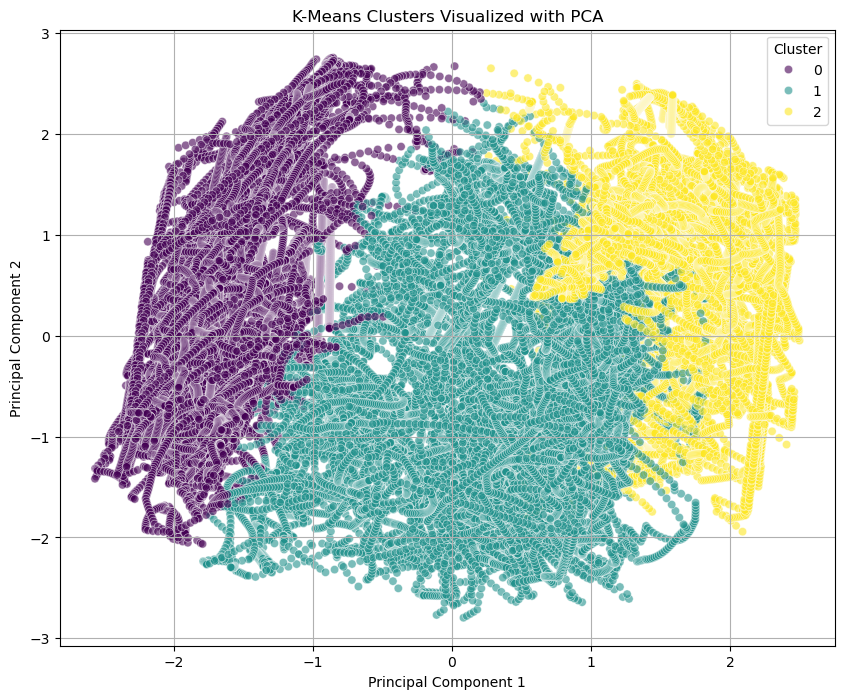

In [42]:
from sklearn.decomposition import PCA

# Initialize PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(X_scaled)

# Add to DataFrame
boid['PC1'] = principal_components[:, 0]
boid['PC2'] = principal_components[:, 1]

# Scatter Plot
plt.figure(figsize=(10, 8))
sns.scatterplot(x='PC1', y='PC2', hue='KMeans_Cluster', data=boid, palette='viridis', alpha=0.6)
plt.title('K-Means Clusters Visualized with PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


In [43]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

# Calculate Silhouette Score
silhouette_avg = silhouette_score(X_scaled, clusters)
print("Silhouette Score for K-Means with K={}: {:.2f}".format(optimal_K, silhouette_avg))

# Calculate Davies-Bouldin Index
db_index = davies_bouldin_score(X_scaled, clusters)
print("Davies-Bouldin Index for K-Means with K={}: {:.2f}".format(optimal_K, db_index))


Silhouette Score for K-Means with K=3: 0.26
Davies-Bouldin Index for K-Means with K=3: 1.54


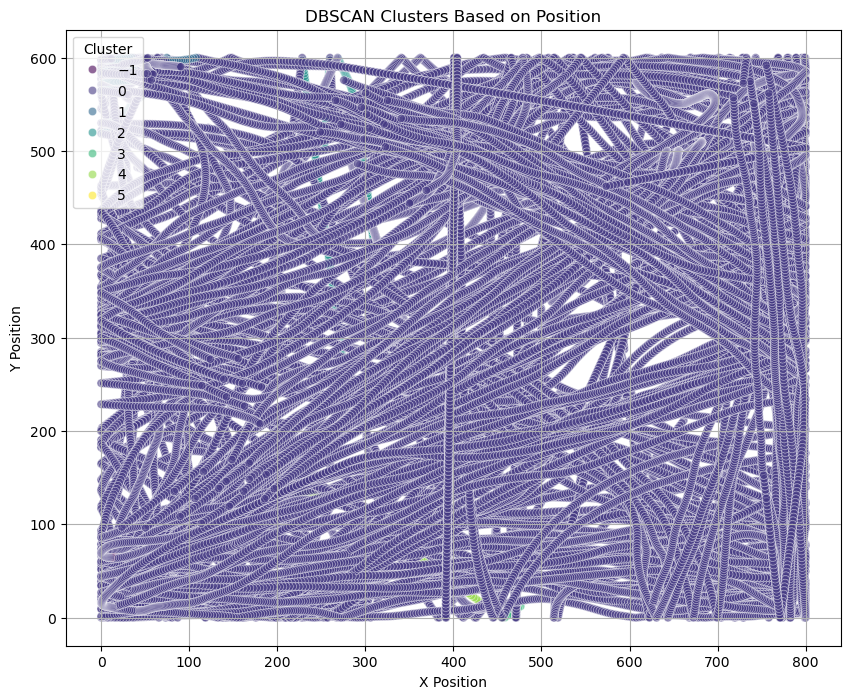

In [44]:
from sklearn.cluster import DBSCAN

# Initialize DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)

# Fit and predict
db_clusters = dbscan.fit_predict(X_scaled)

# Add to DataFrame
boid['DBSCAN_Cluster'] = db_clusters

# Visualize
plt.figure(figsize=(10, 8))
sns.scatterplot(x='x', y='y', hue='DBSCAN_Cluster', data=boid, palette='viridis', alpha=0.6)
plt.title('DBSCAN Clusters Based on Position')
plt.xlabel('X Position')
plt.ylabel('Y Position')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


In [45]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib import animation
from IPython.display import HTML

# Assign unique colors to each flock
flock_ids = sorted(boid_with_kmeans['flock_id'].unique())
num_flocks = len(flock_ids)
flock_palette = sns.color_palette("hsv", num_flocks)
flock_color_map = {flock_id: flock_palette[i] for i, flock_id in enumerate(flock_ids)}

# Assign unique markers to each K-Means cluster
kmeans_clusters = sorted(boid_with_kmeans['kmeans_cluster'].unique())
markers = ['o', 's', '^', 'D', 'P', '*', 'X', 'v', '<', '>', 'h', 'H', 'd', 'p', '|', '_']
kmeans_marker_map = {cluster: markers[i % len(markers)] for i, cluster in enumerate(kmeans_clusters)}


Text(0, 0.5, 'y (standardized)')

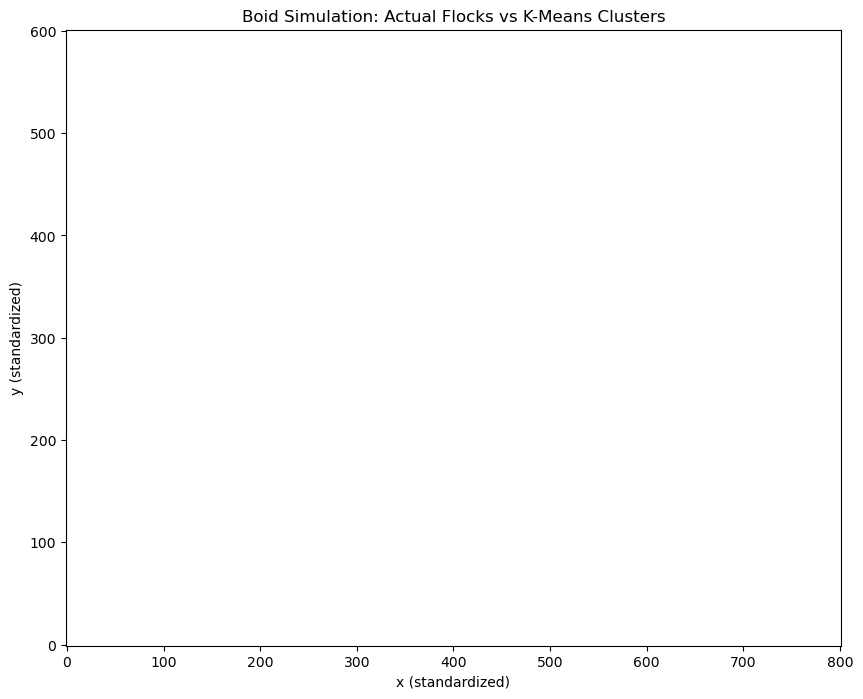

In [46]:
# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Set axis limits based on data
x_min, x_max = boid_with_kmeans['x'].min() - 1, boid_with_kmeans['x'].max() + 1
y_min, y_max = boid_with_kmeans['y'].min() - 1, boid_with_kmeans['y'].max() + 1
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Set plot titles and labels
ax.set_title('Boid Simulation: Actual Flocks vs K-Means Clusters')
ax.set_xlabel('x (standardized)')
ax.set_ylabel('y (standardized)')


In [47]:
def init():
    # Clear the axis
    ax.clear()
    
    # Re-set axis limits and labels
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_title('Boid Simulation: Actual Flocks vs K-Means Clusters')
    ax.set_xlabel('x (standardized)')
    ax.set_ylabel('y (standardized)')
    
    # Return an empty list of artists
    return []


In [48]:
def animate(frame):
    # Clear the axis for fresh plotting
    ax.clear()
    
    # Re-set axis limits and labels
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_title(f'Boid Simulation: Frame {frame}')
    ax.set_xlabel('x (standardized)')
    ax.set_ylabel('y (standardized)')
    
    # Extract data for the current frame
    frame_data = boid_with_kmeans[boid_with_kmeans['frame'] == frame]
    
    if frame_data.empty:
        return []
    
    # Plot boids colored by actual flock
    for flock_id in flock_ids:
        flock_data = frame_data[frame_data['flock_id'] == flock_id]
        ax.scatter(
            flock_data['x'],
            flock_data['y'],
            color=flock_color_map[flock_id],
            marker='o',
            s=50,
            edgecolor='k',
            label=f'Flock {flock_id}'
        )
    
    # Overlay K-Means clusters with different markers
    for cluster in kmeans_clusters:
        cluster_data = frame_data[frame_data['kmeans_cluster'] == cluster]
        if cluster_data.empty:
            continue
        ax.scatter(
            cluster_data['x'],
            cluster_data['y'],
            color='none',  # No fill color to highlight markers
            edgecolor='w',
            marker=kmeans_marker_map[cluster],
            s=100,
            linewidth=1.5,
            label=f'Cluster {cluster}'
        )
    
    # Handle legend to avoid duplicate labels
    handles, labels = ax.get_legend_handles_labels()
    by_label = dict(zip(labels, handles))
    ax.legend(by_label.values(), by_label.keys(), bbox_to_anchor=(1.05, 1), loc='upper left')
    
    return []


In [49]:
#from matplotlib.animation import FuncAnimation

# Determine the total number of frames
#total_frames = len(frames)

# Create the animation
#anim = FuncAnimation(
#    fig, 
 #   animate, 
  #  init_func=init,
  #  frames=frames, 
  #  interval=200,  # Duration between frames in milliseconds
  #  blit=False,
  #  repeat=False
#)

# Display the animation in Jupyter Notebook
#HTML(anim.to_jshtml())


In [50]:
from sklearn.preprocessing import StandardScaler

# Define the features to be used for clustering
features = ['x', 'y', 'vx', 'vy']

# Initialize the scaler
scaler = StandardScaler()

# Fit and transform the features
boid[features] = scaler.fit_transform(boid[features])

# Display the first few rows after scaling
print("\nDataFrame after feature scaling:")
print(boid.head())



DataFrame after feature scaling:
   boid_id    color  flock_id  frame        vx        vy         x         y  \
0        0  #49f871         1    0.0 -1.002529 -1.192991  0.077110 -0.576755   
1        1  #49f871         1    0.0  0.958485  0.143419 -0.155476 -0.017237   
2        2  #49f871         1    0.0 -0.092458 -0.686694 -1.556930  1.462490   
3        3  #49f871         1    0.0  0.431657 -0.634038 -0.384950 -1.011473   
4        4  #49f871         1    0.0  0.043430 -1.753688 -0.481507 -0.201878   

   KMeans_Cluster     speed  direction       PC1       PC2  DBSCAN_Cluster  
0               0  3.106778  -2.494813 -1.860667  0.013203               0  
1               1  2.177537   0.137948  0.260729 -0.193774               0  
2               0  1.099470  -1.873491 -1.398890  1.062689               1  
3               1  1.326535  -0.813425 -0.805523 -0.400901               0  
4               0  2.783337  -1.573126 -1.857273 -0.225431               0  


In [51]:
# Determine the number of unique flocks
num_flocks = boid['flock_id'].nunique()
print(f"\nNumber of unique flocks: {num_flocks}")



Number of unique flocks: 2


In [52]:
# Group the data by 'frame'
frames_grouped = boid.groupby('frame')

# Create a dictionary to store separate DataFrames for each frame
frames_dict = {frame: data.copy() for frame, data in frames_grouped}

# Example: Accessing DataFrame for frame 1
print(f"\nDataFrame for frame {list(frames_dict.keys())[0]}:")
print(list(frames_dict.values())[0].head())



DataFrame for frame 0.0:
   boid_id    color  flock_id  frame        vx        vy         x         y  \
0        0  #49f871         1    0.0 -1.002529 -1.192991  0.077110 -0.576755   
1        1  #49f871         1    0.0  0.958485  0.143419 -0.155476 -0.017237   
2        2  #49f871         1    0.0 -0.092458 -0.686694 -1.556930  1.462490   
3        3  #49f871         1    0.0  0.431657 -0.634038 -0.384950 -1.011473   
4        4  #49f871         1    0.0  0.043430 -1.753688 -0.481507 -0.201878   

   KMeans_Cluster     speed  direction       PC1       PC2  DBSCAN_Cluster  
0               0  3.106778  -2.494813 -1.860667  0.013203               0  
1               1  2.177537   0.137948  0.260729 -0.193774               0  
2               0  1.099470  -1.873491 -1.398890  1.062689               1  
3               1  1.326535  -0.813425 -0.805523 -0.400901               0  
4               0  2.783337  -1.573126 -1.857273 -0.225431               0  


In [53]:
from sklearn.cluster import KMeans
from tqdm import tqdm

# Initialize K-Means with the determined number of clusters
kmeans = KMeans(n_clusters=num_flocks, random_state=42)

# Initialize a list to collect DataFrames with K-Means labels
kmeans_dfs = []

# Iterate through each frame and perform K-Means with a progress bar
for frame, frame_data in tqdm(frames_dict.items(), desc="Performing K-Means Clustering"):
    positions = frame_data[features].values
    
    # Edge Case Handling: Ensure number of boids >= number of clusters
    if len(frame_data) < num_flocks:
        print(f"Skipping frame {frame}: Not enough boids ({len(frame_data)}) for {num_flocks} clusters")
        continue
    
    # Fit K-Means
    kmeans.fit(positions)
    labels = kmeans.labels_
    
    # Store the labels in the frame's DataFrame
    frame_data = frame_data.copy()
    frame_data['kmeans_cluster'] = labels
    
    # Append to the list
    kmeans_dfs.append(frame_data)


Performing K-Means Clustering: 100%|██████████████████████████████████████████████| 1321/1321 [00:03<00:00, 350.38it/s]


In [54]:
# Concatenate all frame DataFrames with K-Means labels
boid_with_kmeans = pd.concat(kmeans_dfs, ignore_index=True)

# Display the first few rows
print("\nDataFrame with K-Means Cluster Assignments:")
print(boid_with_kmeans.head())



DataFrame with K-Means Cluster Assignments:
   boid_id    color  flock_id  frame        vx        vy         x         y  \
0        0  #49f871         1    0.0 -1.002529 -1.192991  0.077110 -0.576755   
1        1  #49f871         1    0.0  0.958485  0.143419 -0.155476 -0.017237   
2        2  #49f871         1    0.0 -0.092458 -0.686694 -1.556930  1.462490   
3        3  #49f871         1    0.0  0.431657 -0.634038 -0.384950 -1.011473   
4        4  #49f871         1    0.0  0.043430 -1.753688 -0.481507 -0.201878   

   KMeans_Cluster     speed  direction       PC1       PC2  DBSCAN_Cluster  \
0               0  3.106778  -2.494813 -1.860667  0.013203               0   
1               1  2.177537   0.137948  0.260729 -0.193774               0   
2               0  1.099470  -1.873491 -1.398890  1.062689               1   
3               1  1.326535  -0.813425 -0.805523 -0.400901               0   
4               0  2.783337  -1.573126 -1.857273 -0.225431               0   

   km

In [55]:
print(frame_data)

       boid_id    color  flock_id   frame        vx        vy         x  \
79200        0  #49f871         1  1320.0 -0.164553  2.080988  1.281270   
79201        1  #49f871         1  1320.0 -0.964937  0.483208 -0.605713   
79202        2  #49f871         1  1320.0  0.722668  0.266777 -1.488587   
79203        3  #49f871         1  1320.0  0.473482 -0.362652 -1.463864   
79204        4  #49f871         1  1320.0 -1.063140  0.359118 -0.393175   
79205        5  #49f871         1  1320.0 -1.230702  0.807610 -0.408874   
79206        6  #49f871         1  1320.0 -0.091141  1.938779  1.349539   
79207        7  #49f871         1  1320.0 -1.046338  0.464116 -0.402244   
79208        8  #49f871         1  1320.0  1.070268 -0.295610 -1.577984   
79209        9  #49f871         1  1320.0  1.017047 -0.443995 -1.472224   
79210       10  #49f871         1  1320.0 -1.180716  0.164971 -0.330123   
79211       11  #49f871         1  1320.0 -1.104615  0.565987 -0.529836   
79212       12  #49f871  

In [56]:
from sklearn.metrics import confusion_matrix, accuracy_score, adjusted_rand_score, normalized_mutual_info_score
from scipy.optimize import linear_sum_assignment

def map_clusters_to_flocks(true_labels, predicted_labels, num_clusters):
    # Compute confusion matrix
    cm = confusion_matrix(true_labels, predicted_labels, labels=range(num_clusters))
    
    # Apply the Hungarian Algorithm to find the best mapping
    row_ind, col_ind = linear_sum_assignment(-cm)  # Maximize the matches
    
    # Create a mapping from cluster label to flock ID
    mapping = {}
    for row, col in zip(row_ind, col_ind):
        mapping[col] = row  # cluster_label -> flock_id
    
    # Handle clusters with no assignments by assigning a default value (e.g., -1)
    for cluster_label in range(num_clusters):
        if cluster_label not in mapping:
            mapping[cluster_label] = -1  # or any other placeholder for 'unassigned'
    
    return mapping

# Initialize a list to store mapped labels
mapped_labels = []

# Assuming 'num_flocks' is already defined as the number of unique flocks
num_clusters = num_flocks

# Initialize a list to store mapped labels
mapped_labels = []

# Iterate through each frame and map clusters
for frame in tqdm(frames_grouped.groups.keys(), desc="Mapping Clusters to Flocks"):
    frame_data = frames_dict[frame]
    if len(frame_data) < num_flocks:
        # Skipped frames earlier due to insufficient boids
        continue
    
    true_labels = frame_data['flock_id'].values
    predicted_labels = frame_data['KMeans_Cluster'].values
    
    # Get the optimal mapping for this frame
    mapping = map_clusters_to_flocks(true_labels, predicted_labels, num_clusters)
    
    # Map the predicted cluster labels to flock IDs with a default value for unmapped clusters
    mapped_frame_labels = [mapping.get(label, -1) for label in predicted_labels]
    
    # Append to the list
    mapped_labels.extend(mapped_frame_labels)

# Add the mapped labels to the DataFrame
boid_with_kmeans['mapped_kmeans_cluster'] = mapped_labels

# Display the first few rows
print("\nDataFrame with Mapped K-Means Clusters:")
print(boid_with_kmeans.head())


Mapping Clusters to Flocks: 100%|████████████████████████████████████████████████| 1321/1321 [00:00<00:00, 1829.79it/s]



DataFrame with Mapped K-Means Clusters:
   boid_id    color  flock_id  frame        vx        vy         x         y  \
0        0  #49f871         1    0.0 -1.002529 -1.192991  0.077110 -0.576755   
1        1  #49f871         1    0.0  0.958485  0.143419 -0.155476 -0.017237   
2        2  #49f871         1    0.0 -0.092458 -0.686694 -1.556930  1.462490   
3        3  #49f871         1    0.0  0.431657 -0.634038 -0.384950 -1.011473   
4        4  #49f871         1    0.0  0.043430 -1.753688 -0.481507 -0.201878   

   KMeans_Cluster     speed  direction       PC1       PC2  DBSCAN_Cluster  \
0               0  3.106778  -2.494813 -1.860667  0.013203               0   
1               1  2.177537   0.137948  0.260729 -0.193774               0   
2               0  1.099470  -1.873491 -1.398890  1.062689               1   
3               1  1.326535  -0.813425 -0.805523 -0.400901               0   
4               0  2.783337  -1.573126 -1.857273 -0.225431               0   

   kmeans

In [57]:
# Create a mask for boids with valid mappings
valid_mask = boid_with_kmeans['mapped_kmeans_cluster'] != -1

# Filter the DataFrame
valid_boids = boid_with_kmeans[valid_mask]

# Extract true labels and mapped labels
true_labels_valid = valid_boids['flock_id'].values
mapped_labels_valid = valid_boids['mapped_kmeans_cluster'].values

# Calculate accuracy
accuracy = accuracy_score(true_labels_valid, mapped_labels_valid)
print(f"\nOverall Clustering Accuracy (Excluding Unmapped): {accuracy * 100:.2f}%")



Overall Clustering Accuracy (Excluding Unmapped): 33.27%


In [58]:
# Extract true labels and predicted labels
true_labels_all = boid_with_kmeans['flock_id'].values
predicted_labels_all = boid_with_kmeans['kmeans_cluster'].values

# Calculate ARI
ari = adjusted_rand_score(true_labels_all, predicted_labels_all)
print(f"Overall Adjusted Rand Index (ARI): {ari:.4f}")

# Calculate NMI
nmi = normalized_mutual_info_score(true_labels_all, predicted_labels_all)
print(f"Overall Normalized Mutual Information (NMI): {nmi:.4f}")


Overall Adjusted Rand Index (ARI): 0.0891
Overall Normalized Mutual Information (NMI): 0.0656


In [59]:
# Initialize lists to store per-frame metrics
per_frame_metrics = []

# Iterate through each frame to calculate metrics
for frame in tqdm(frames_grouped.groups.keys(), desc="Calculating Per-Frame Metrics"):
    frame_data = frames_dict[frame]
    if len(frame_data) < num_flocks:
        # Skipped frames earlier due to insufficient boids
        continue
    
    true_labels = frame_data['flock_id'].values
    mapped_labels_frame = boid_with_kmeans[boid_with_kmeans['frame'] == frame]['mapped_kmeans_cluster'].values
    predicted_labels = frame_data['KMeans_Cluster'].values
    
    # Calculate metrics
    acc = accuracy_score(true_labels, mapped_labels_frame)
    ari = adjusted_rand_score(true_labels, predicted_labels)
    nmi = normalized_mutual_info_score(true_labels, predicted_labels)
    
    # Append to the list
    per_frame_metrics.append({
        'frame': frame,
        'accuracy': acc,
        'ARI': ari,
        'NMI': nmi
    })

# Convert the list to a DataFrame
metrics_df = pd.DataFrame(per_frame_metrics)

# Display the first few rows
print("\nPer-Frame Clustering Metrics:")
print(metrics_df.head())


Calculating Per-Frame Metrics: 100%|██████████████████████████████████████████████| 1321/1321 [00:03<00:00, 375.58it/s]


Per-Frame Clustering Metrics:
   frame  accuracy       ARI       NMI
0    0.0  0.233333 -0.014323  0.006280
1    1.0  0.233333 -0.018749  0.002994
2    2.0  0.233333 -0.018749  0.002994
3    3.0  0.233333 -0.018749  0.002994
4    4.0  0.233333 -0.018749  0.002994


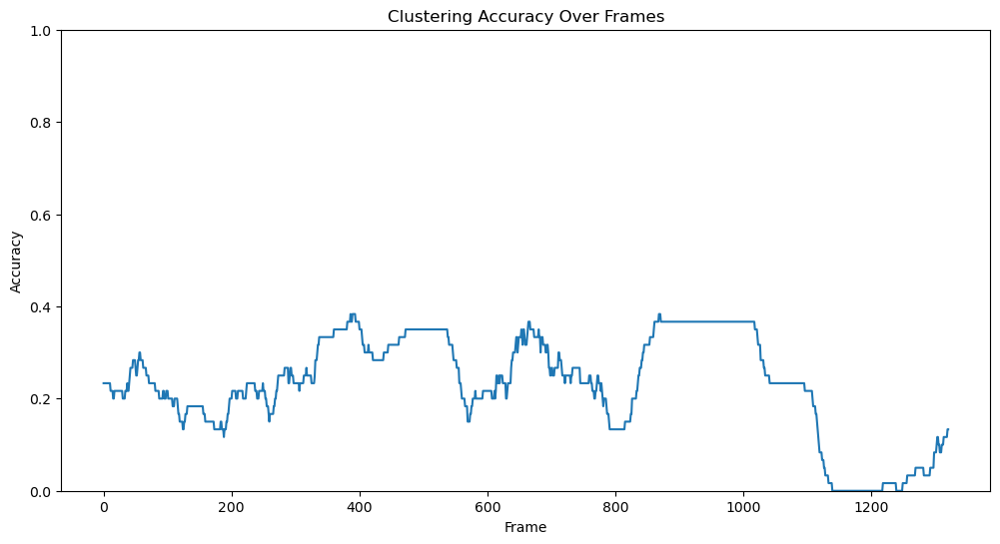

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.lineplot(data=metrics_df, x='frame', y='accuracy')
plt.title('Clustering Accuracy Over Frames')
plt.xlabel('Frame')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.show()


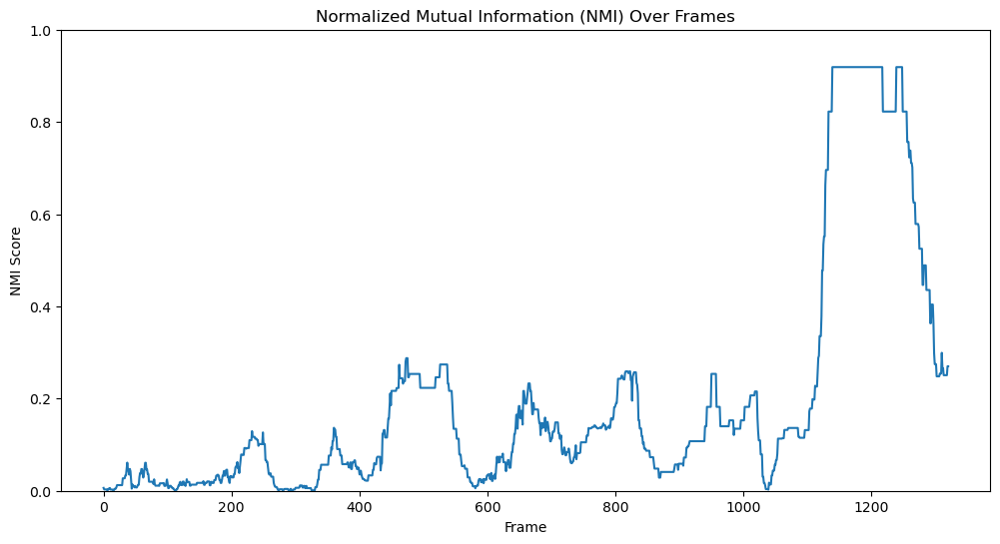

In [61]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=metrics_df, x='frame', y='NMI')
plt.title('Normalized Mutual Information (NMI) Over Frames')
plt.xlabel('Frame')
plt.ylabel('NMI Score')
plt.ylim(0, 1)
plt.show()


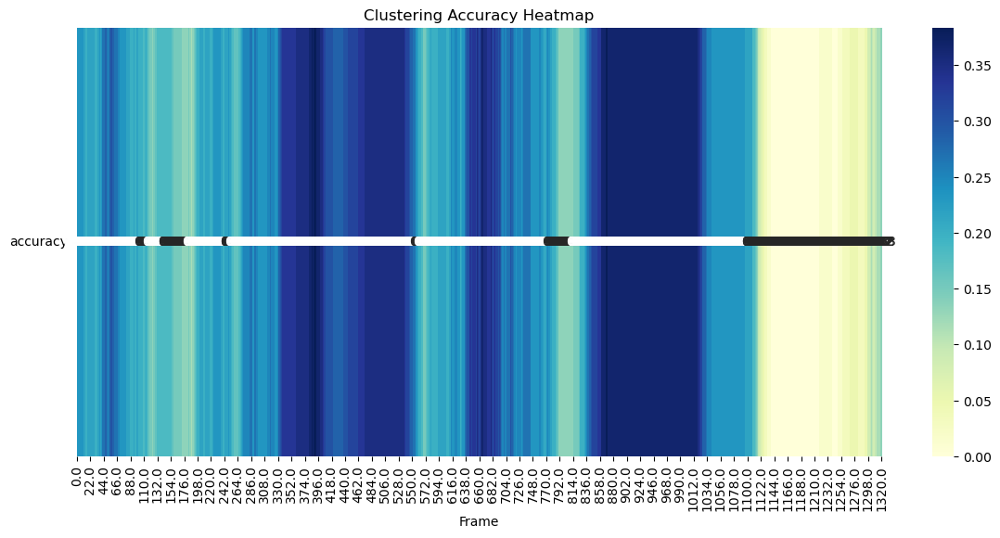

In [62]:
plt.figure(figsize=(14, 6))
sns.heatmap(metrics_df[['frame', 'accuracy']].set_index('frame').T, annot=True, fmt=".2f", cmap='YlGnBu')
plt.title('Clustering Accuracy Heatmap')
plt.xlabel('Frame')
plt.yticks(rotation=0)
plt.show()


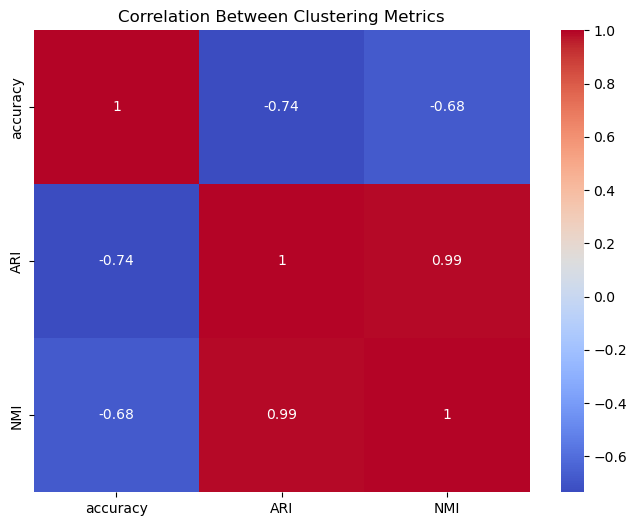

In [63]:
# Compute the correlation matrix
correlation_matrix = metrics_df[['accuracy', 'ARI', 'NMI']].corr()

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Between Clustering Metrics')
plt.show()


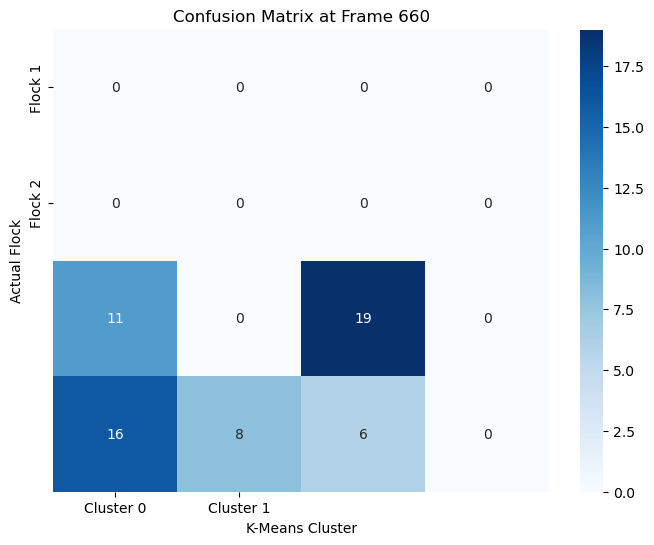

In [64]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select a specific frame to visualize (e.g., the median frame)
median_frame = metrics_df['frame'].median()
median_frame = int(median_frame)
frame_data = boid_with_kmeans[boid_with_kmeans['frame'] == median_frame]

# True labels and K-Means labels
true_labels = frame_data['flock_id'].values
mapped_labels = frame_data['mapped_kmeans_cluster'].values

# Compute confusion matrix
cm = confusion_matrix(true_labels, mapped_labels)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=[f'Cluster {c}' for c in sorted(boid_with_kmeans["kmeans_cluster"].unique())],
            yticklabels=[f'Flock {f}' for f in sorted(boid_with_kmeans["flock_id"].unique())])
plt.xlabel('K-Means Cluster')
plt.ylabel('Actual Flock')
plt.title(f'Confusion Matrix at Frame {median_frame}')
plt.show()


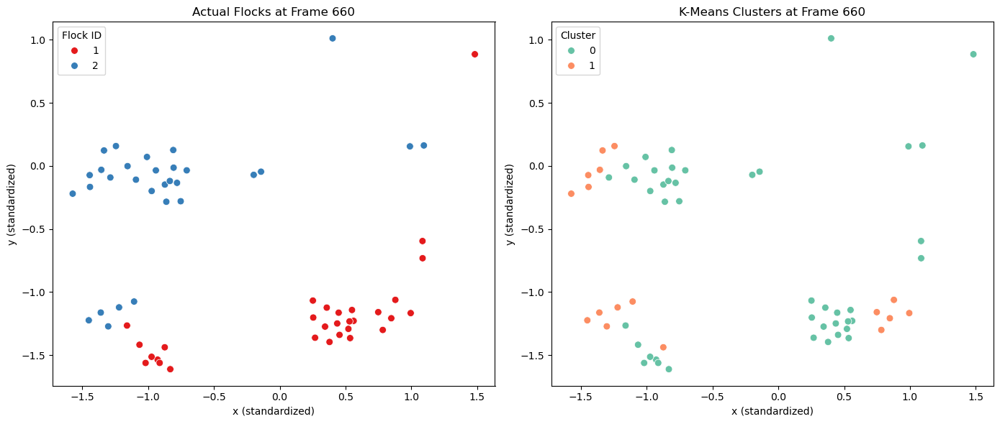

In [65]:
plt.figure(figsize=(14, 6))

# Actual Flocks
plt.subplot(1, 2, 1)
sns.scatterplot(data=frame_data, x='x', y='y', hue='flock_id',
                palette='Set1', s=50, edgecolor='w')
plt.title(f'Actual Flocks at Frame {median_frame}')
plt.xlabel('x (standardized)')
plt.ylabel('y (standardized)')
plt.legend(title='Flock ID')

# K-Means Clusters
plt.subplot(1, 2, 2)
sns.scatterplot(data=frame_data, x='x', y='y', hue='kmeans_cluster',
                palette='Set2', s=50, edgecolor='w')
plt.title(f'K-Means Clusters at Frame {median_frame}')
plt.xlabel('x (standardized)')
plt.ylabel('y (standardized)')
plt.legend(title='Cluster')

plt.tight_layout()
plt.show()


TypeError: seaborn.utils._scatter_legend_artist() got multiple values for keyword argument 'label'

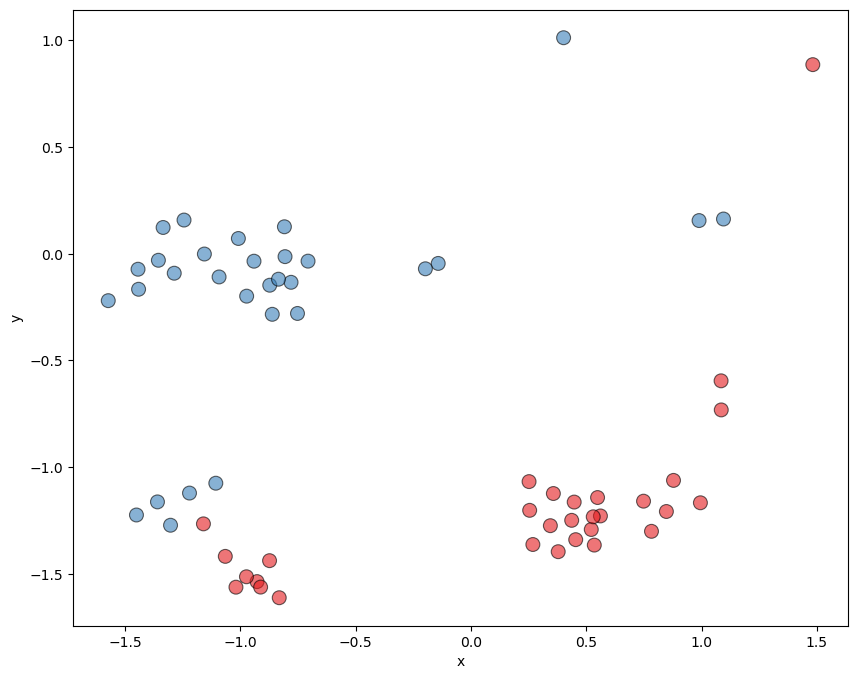

In [66]:
plt.figure(figsize=(10, 8))

# Plot actual flocks
sns_plot = sns.scatterplot(data=frame_data, x='x', y='y', hue='flock_id',
                           palette='Set1', s=100, edgecolor='k', alpha=0.6, label='Actual Flock')

# Plot K-Means clusters with different markers
cluster_handles = []
unique_clusters = sorted(frame_data['KMeans_Cluster'].unique())
for cluster in unique_clusters:
    cluster_data = frame_data[frame_data['KMeans_Cluster'] == cluster]
    if cluster_data.empty:
        continue
    scatter = plt.scatter(cluster_data['x'], cluster_data['y'],
                          marker=kmeans_marker_map[cluster],
                          edgecolors='w', s=100, label=f'Cluster {cluster}')
    cluster_handles.append(scatter)

plt.title(f'Boid Simulation: Frame {median_frame} - Actual Flocks vs K-Means Clusters')
plt.xlabel('x (standardized)')
plt.ylabel('y (standardized)')

# Get Seaborn handles and labels
handles, labels = sns_plot.get_legend_handles_labels()
handles = handles[1:]  # Remove the first handle if it's redundant

# Append cluster handles and labels
handles += cluster_handles
labels += [f'Cluster {cluster}' for cluster in unique_clusters]

plt.legend(handles, labels, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


In [67]:
# Save the per-frame metrics to a CSV file
metrics_df.to_csv("clustering_performance_metrics.csv", index=False)
print("\nPer-frame clustering metrics saved to 'clustering_performance_metrics.csv'.")



Per-frame clustering metrics saved to 'clustering_performance_metrics.csv'.


In [68]:
# Example: Save the Accuracy Over Frames plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=metrics_df, x='frame', y='accuracy')
plt.title('Clustering Accuracy Over Frames')
plt.xlabel('Frame')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.savefig('clustering_accuracy_over_frames.png', dpi=300)
plt.close()
print("Accuracy Over Frames plot saved as 'clustering_accuracy_over_frames.png'.")


Accuracy Over Frames plot saved as 'clustering_accuracy_over_frames.png'.


In [69]:
# Determine the number of clusters (assuming it's equal to the number of unique flocks)
num_flocks = boid['flock_id'].nunique()
num_clusters = num_flocks

# Initialize lists to store results
pca_dfs = []
kmeans_dfs = []

# Define the number of principal components
n_components = 2  # For visualization; adjust as needed

# Initialize PCA
pca = PCA(n_components=n_components)

# Iterate through each frame and perform PCA and K-Means
for frame, frame_data in tqdm(frames_dict.items(), desc="Performing PCA and K-Means"):
    if len(frame_data) < num_clusters:
        # Skip frames with insufficient boids
        continue
    
    # Extract features for PCA
    X = frame_data[features].values
    
    # Apply PCA
    X_pca = pca.fit_transform(X)
    
    # Perform K-Means on PCA-transformed data
    kmeans = KMeans(n_clusters=num_clusters, random_state=42)
    labels = kmeans.fit_predict(X_pca)
    
    # Store PCA-transformed data and labels
    frame_data_pca = frame_data.copy()
    frame_data_pca[['pc1', 'pc2']] = X_pca
    frame_data_pca['kmeans_cluster_pca'] = labels
    pca_dfs.append(frame_data_pca)
    
    # Optionally, store the PCA model or K-Means model if needed
    # (Not storing here for simplicity)
    
# Concatenate all frames' PCA and K-Means results
boid_with_pca_kmeans = pd.concat(pca_dfs, ignore_index=True)


Performing PCA and K-Means: 100%|█████████████████████████████████████████████████| 1321/1321 [00:05<00:00, 259.98it/s]


In [70]:
def map_clusters_to_flocks(true_labels, predicted_labels, num_clusters):
    # Compute confusion matrix
    cm = confusion_matrix(true_labels, predicted_labels, labels=range(num_clusters))
    
    # Apply Hungarian Algorithm to maximize the number of correct assignments
    row_ind, col_ind = linear_sum_assignment(-cm)
    
    # Create a mapping from cluster label to flock ID
    mapping = {}
    for row, col in zip(row_ind, col_ind):
        mapping[col] = row  # cluster_label -> flock_id
    
    # Handle clusters with no assignments by assigning a default value (e.g., -1)
    for cluster_label in range(num_clusters):
        if cluster_label not in mapping:
            mapping[cluster_label] = -1  # or any other placeholder for 'unassigned'
    
    return mapping


In [71]:
# Initialize a list to store mapped labels
mapped_labels = []

# Initialize a list to track frames with unmapped clusters
frames_with_unmapped_clusters = []

# Iterate through each frame and map clusters
for frame in tqdm(frames_grouped.groups.keys(), desc="Mapping PCA Clusters to Flocks"):
    frame_data = frames_dict[frame]
    if len(frame_data) < num_clusters:
        # Skip frames with insufficient boids
        continue
    
    # Extract true labels and predicted cluster labels
    true_labels = frame_data['flock_id'].values
    predicted_labels = boid_with_pca_kmeans.loc[boid_with_pca_kmeans['frame'] == frame, 'kmeans_cluster_pca'].values
    
    # Get the optimal mapping
    mapping = map_clusters_to_flocks(true_labels, predicted_labels, num_clusters)
    
    # Identify missing clusters
    missing_clusters = set(range(num_clusters)) - set(predicted_labels)
    if missing_clusters:
        frames_with_unmapped_clusters.append((frame, missing_clusters))
        print(f"Frame {frame} is missing clusters: {missing_clusters}")
    
    # Map the predicted cluster labels to flock IDs with a default value for unmapped clusters
    mapped_frame_labels = [mapping.get(label, -1) for label in predicted_labels]
    
    # Append to the list
    mapped_labels.extend(mapped_frame_labels)
    
# Add the mapped labels to the DataFrame
boid_with_pca_kmeans['mapped_kmeans_cluster_pca'] = mapped_labels

# Display the first few rows
print("\nDataFrame with Mapped K-Means Clusters (PCA):")
print(boid_with_pca_kmeans.head())


Mapping PCA Clusters to Flocks: 100%|████████████████████████████████████████████| 1321/1321 [00:01<00:00, 1175.53it/s]



DataFrame with Mapped K-Means Clusters (PCA):
   boid_id    color  flock_id  frame        vx        vy         x         y  \
0        0  #49f871         1    0.0 -1.002529 -1.192991  0.077110 -0.576755   
1        1  #49f871         1    0.0  0.958485  0.143419 -0.155476 -0.017237   
2        2  #49f871         1    0.0 -0.092458 -0.686694 -1.556930  1.462490   
3        3  #49f871         1    0.0  0.431657 -0.634038 -0.384950 -1.011473   
4        4  #49f871         1    0.0  0.043430 -1.753688 -0.481507 -0.201878   

   KMeans_Cluster     speed  direction       PC1       PC2  DBSCAN_Cluster  \
0               0  3.106778  -2.494813 -1.860667  0.013203               0   
1               1  2.177537   0.137948  0.260729 -0.193774               0   
2               0  1.099470  -1.873491 -1.398890  1.062689               1   
3               1  1.326535  -0.813425 -0.805523 -0.400901               0   
4               0  2.783337  -1.573126 -1.857273 -0.225431               0   

   

In [72]:
# Create a mask for boids with valid mappings
valid_mask = boid_with_pca_kmeans['mapped_kmeans_cluster_pca'] != -1

# Filter the DataFrame
valid_boids = boid_with_pca_kmeans[valid_mask]

# Extract true labels and mapped labels
true_labels_valid = valid_boids['flock_id'].values
mapped_labels_valid = valid_boids['mapped_kmeans_cluster_pca'].values

# Calculate accuracy
accuracy = accuracy_score(true_labels_valid, mapped_labels_valid)
print(f"\nOverall Clustering Accuracy (Excluding Unmapped): {accuracy * 100:.2f}%")



Overall Clustering Accuracy (Excluding Unmapped): 33.71%


In [73]:
# Extract true labels and predicted labels
true_labels_all = boid_with_pca_kmeans['flock_id'].values
predicted_labels_all = boid_with_pca_kmeans['kmeans_cluster_pca'].values

# Calculate ARI
ari = adjusted_rand_score(true_labels_all, predicted_labels_all)
print(f"Overall Adjusted Rand Index (ARI): {ari:.4f}")


Overall Adjusted Rand Index (ARI): 0.0684


In [74]:
# Calculate NMI
nmi = normalized_mutual_info_score(true_labels_all, predicted_labels_all)
print(f"Overall Normalized Mutual Information (NMI): {nmi:.4f}")


Overall Normalized Mutual Information (NMI): 0.0502


In [75]:
# Initialize lists to store per-frame metrics
per_frame_metrics = []

# Iterate through each frame to calculate metrics
for frame in tqdm(frames_grouped.groups.keys(), desc="Calculating Per-Frame Metrics"):
    frame_data = frames_dict[frame]
    if len(frame_data) < num_clusters:
        # Skip frames with insufficient boids
        continue
    
    # Extract true labels and predicted cluster labels for the frame
    true_labels = frame_data['flock_id'].values
    predicted_labels = boid_with_pca_kmeans.loc[boid_with_pca_kmeans['frame'] == frame, 'kmeans_cluster_pca'].values
    mapped_labels_frame = boid_with_pca_kmeans.loc[boid_with_pca_kmeans['frame'] == frame, 'mapped_kmeans_cluster_pca'].values
    
    # Create a mask for boids with valid mappings
    valid_mask = mapped_labels_frame != -1
    if np.sum(valid_mask) == 0:
        # No valid mappings in this frame
        acc = np.nan
    else:
        # Calculate accuracy only on valid mappings
        acc = accuracy_score(true_labels[valid_mask], mapped_labels_frame[valid_mask])
    
    # Calculate ARI and NMI
    ari = adjusted_rand_score(true_labels, predicted_labels)
    nmi = normalized_mutual_info_score(true_labels, predicted_labels)
    
    # Append to the list
    per_frame_metrics.append({
        'frame': frame,
        'accuracy': acc,
        'ARI': ari,
        'NMI': nmi
    })

# Convert the list to a DataFrame
metrics_df = pd.DataFrame(per_frame_metrics)

# Display the first few rows
print("\nPer-Frame Clustering Metrics (PCA):")
print(metrics_df.head())


Calculating Per-Frame Metrics: 100%|██████████████████████████████████████████████| 1321/1321 [00:04<00:00, 322.58it/s]


Per-Frame Clustering Metrics (PCA):
   frame  accuracy       ARI       NMI
0    0.0      0.35 -0.008932  0.004472
1    1.0      0.35 -0.008932  0.004472
2    2.0      0.35 -0.008932  0.004472
3    3.0      0.35 -0.008932  0.004472
4    4.0      0.35 -0.008932  0.004472


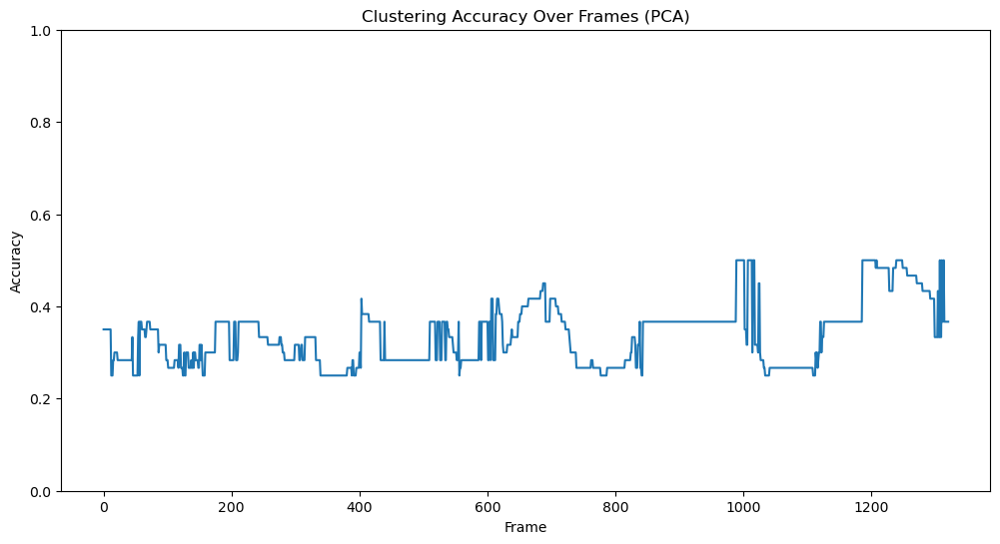

In [76]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=metrics_df, x='frame', y='accuracy')
plt.title('Clustering Accuracy Over Frames (PCA)')
plt.xlabel('Frame')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.show()


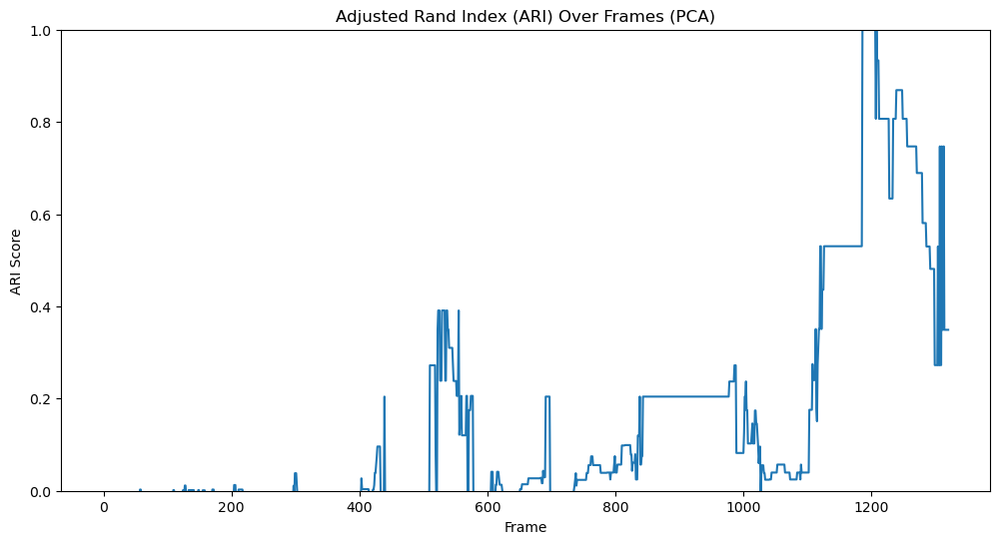

In [77]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=metrics_df, x='frame', y='ARI')
plt.title('Adjusted Rand Index (ARI) Over Frames (PCA)')
plt.xlabel('Frame')
plt.ylabel('ARI Score')
plt.ylim(0, 1)
plt.show()


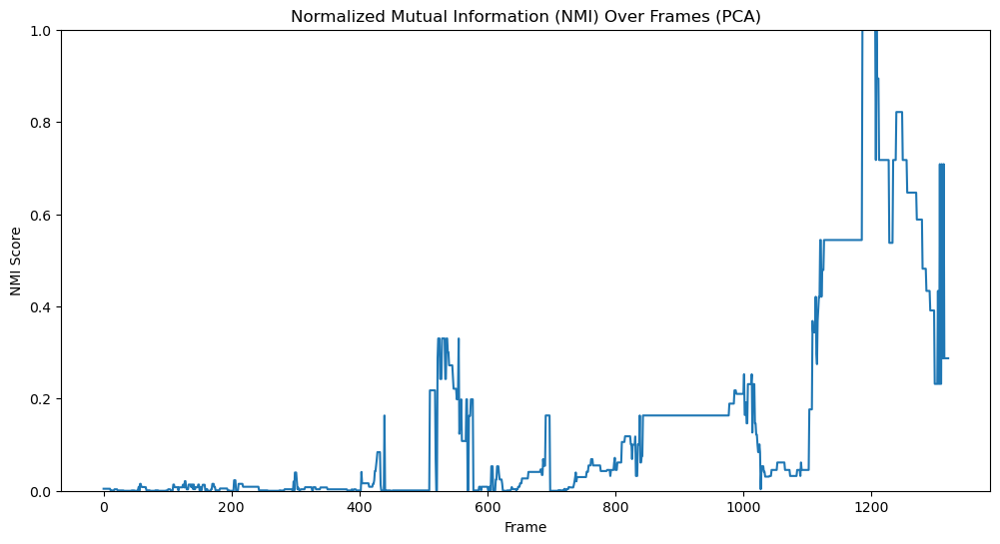

In [78]:
plt.figure(figsize=(12, 6))
sns.lineplot(data=metrics_df, x='frame', y='NMI')
plt.title('Normalized Mutual Information (NMI) Over Frames (PCA)')
plt.xlabel('Frame')
plt.ylabel('NMI Score')
plt.ylim(0, 1)
plt.show()


In [ ]:
plt.figure(figsize=(14, 6))
sns.heatmap(metrics_df[['frame', 'accuracy']].set_index('frame').T, annot=True, fmt=".2f", cmap='YlGnBu')
plt.title('Clustering Accuracy Heatmap (PCA)')
plt.xlabel('Frame')
plt.yticks(rotation=0)
plt.show()


In [ ]:
# Compute the correlation matrix
correlation_matrix = metrics_df[['accuracy', 'ARI', 'NMI']].corr()

# Plot the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Between Clustering Metrics (PCA)')
plt.show()


In [ ]:
def map_clusters_to_flocks(true_labels, predicted_labels, num_clusters):
    """
    Maps K-Means cluster labels to actual flock IDs using the Hungarian Algorithm.
    
    Parameters:
    - true_labels: Array of actual flock IDs.
    - predicted_labels: Array of K-Means cluster labels.
    - num_clusters: Number of clusters (K).
    
    Returns:
    - mapping: Dictionary mapping cluster labels to flock IDs.
    """
    # Compute the confusion matrix
    cm = confusion_matrix(true_labels, predicted_labels, labels=range(num_clusters))
    
    # Apply the Hungarian Algorithm (maximize correct assignments)
    row_ind, col_ind = linear_sum_assignment(-cm)
    
    # Create the mapping from cluster label to flock ID
    mapping = {}
    for row, col in zip(row_ind, col_ind):
        mapping[col] = row  # cluster_label -> flock_id
    
    # Handle clusters with no assignments by assigning a default value (e.g., -1)
    for cluster_label in range(num_clusters):
        if cluster_label not in mapping:
            mapping[cluster_label] = -1  # or any other placeholder for 'unassigned'
    
    return mapping


In [ ]:
def perform_clustering_and_mapping(boid_df, feature_set, num_clusters, apply_pca=False, pca_components=2):
    """
    Performs K-Means clustering on the specified feature set, maps clusters to flocks,
    and calculates accuracy metrics.
    
    Parameters:
    - boid_df: DataFrame containing boid data.
    - feature_set: List of feature column names to use for clustering.
    - num_clusters: Number of clusters (K) for K-Means.
    - apply_pca: Boolean indicating whether to apply PCA.
    - pca_components: Number of principal components to retain if PCA is applied.
    
    Returns:
    - boid_df: DataFrame with additional columns for cluster assignments.
    - accuracy: Overall clustering accuracy (excluding unmapped clusters).
    - ari: Adjusted Rand Index.
    - nmi: Normalized Mutual Information.
    """
    # Initialize lists to store per-frame mapped labels and metrics
    mapped_labels = []
    per_frame_metrics = []
    
    # Group data by frame
    frames_grouped = boid_df.groupby('frame')
    
    # Initialize PCA if required
    if apply_pca:
        pca = PCA(n_components=pca_components)
        # Fit PCA on the entire dataset to ensure consistency
        boid_df_pca = boid_df.copy()
        boid_df_pca[['pc1', 'pc2']] = pca.fit_transform(boid_df[feature_set])
    
    # Iterate through each frame
    for frame, frame_data in tqdm(frames_grouped, desc=f"Clustering with feature set: {feature_set}"):
        if len(frame_data) < num_clusters:
            # Skip frames with insufficient boids
            mapped_labels.extend([-1] * len(frame_data))
            continue
        
        # Extract features
        if apply_pca:
            X = frame_data[['pc1', 'pc2']].values
        else:
            X = frame_data[feature_set].values
        
        # Perform K-Means clustering
        kmeans = KMeans(n_clusters=num_clusters, random_state=42)
        labels = kmeans.fit_predict(X)
        
        # Map clusters to flocks
        true_labels = frame_data['flock_id'].values
        mapping = map_clusters_to_flocks(true_labels, labels, num_clusters)
        
        # Map predicted cluster labels to flock IDs
        mapped_frame_labels = [mapping.get(label, -1) for label in labels]
        mapped_labels.extend(mapped_frame_labels)
        
        # Calculate accuracy for this frame (excluding unmapped clusters)
        valid_mask = np.array(mapped_frame_labels) != -1
        if np.sum(valid_mask) > 0:
            acc = accuracy_score(true_labels[valid_mask], np.array(mapped_frame_labels)[valid_mask])
        else:
            acc = np.nan  # No valid mappings in this frame
        
        # Calculate ARI and NMI for this frame
        ari = adjusted_rand_score(true_labels, labels)
        nmi = normalized_mutual_info_score(true_labels, labels)
        
        # Append metrics
        per_frame_metrics.append({
            'frame': frame,
            'accuracy': acc,
            'ARI': ari,
            'NMI': nmi
        })
        
    # Add mapped labels to the DataFrame
    boid_df['mapped_cluster_' + '_'.join(feature_set)] = mapped_labels
    
    # Convert per-frame metrics to DataFrame
    metrics_df = pd.DataFrame(per_frame_metrics)
    
    # Calculate overall accuracy (excluding unmapped clusters)
    valid_boids = boid_df[boid_df['mapped_cluster_' + '_'.join(feature_set)] != -1]
    overall_accuracy = accuracy_score(
        valid_boids['flock_id'],
        valid_boids['mapped_cluster_' + '_'.join(feature_set)]
    )
    
    # Calculate overall ARI and NMI
    overall_ari = adjusted_rand_score(boid_df['flock_id'], boid_df['mapped_cluster_' + '_'.join(feature_set)].fillna(-1))
    overall_nmi = normalized_mutual_info_score(boid_df['flock_id'], boid_df['mapped_cluster_' + '_'.join(feature_set)].fillna(-1))
    
    return boid_df, metrics_df, overall_accuracy, overall_ari, overall_nmi


In [ ]:
# Define the different feature sets
feature_sets = {
    'position_only': ['x', 'y'],
    'position_velocity': ['x', 'y', 'vx', 'vy'],
    'full_data': ['x', 'y', 'vx', 'vy', 'flock_id', 'speed', 'direction'],  # Update if 'full_data' includes more features
    'pca_2_components': ['x', 'y', 'vx', 'vy']  # Features to apply PCA on
}

print(boid.head())

In [ ]:
# Determine the number of clusters (assuming it's equal to the number of unique flocks)
num_flocks = boid['flock_id'].nunique()

# Initialize a dictionary to store results
results = {}

for feature_key, features in feature_sets.items():
    if feature_key == 'pca_2_components':
        # Apply PCA
        boid_with_pca_kmeans, metrics_df_pca, accuracy_pca, ari_pca, nmi_pca = perform_clustering_and_mapping(
            boid,
            feature_set=features,
            num_clusters=num_flocks,
            apply_pca=True,
            pca_components=2
        )
        # Store results
        results[feature_key] = {
            'DataFrame': boid_with_pca_kmeans,
            'Metrics': metrics_df_pca,
            'Overall Accuracy': accuracy_pca,
            'ARI': ari_pca,
            'NMI': nmi_pca
        }
    else:
        # No PCA
        boid_with_kmeans, metrics_df_kmeans, accuracy_kmeans, ari_kmeans, nmi_kmeans = perform_clustering_and_mapping(
            boid,
            feature_set=features,
            num_clusters=num_flocks,
            apply_pca=False
        )
        # Store results
        results[feature_key] = {
            'DataFrame': boid_with_kmeans,
            'Metrics': metrics_df_kmeans,
            'Overall Accuracy': accuracy_kmeans,
            'ARI': ari_kmeans,
            'NMI': nmi_kmeans
        }
    
    print(f"\nFeature Set: {feature_key}")
    print(f"Overall Accuracy: {results[feature_key]['Overall Accuracy'] * 100:.2f}%")
    print(f"Overall Adjusted Rand Index (ARI): {results[feature_key]['ARI']:.4f}")
    print(f"Overall Normalized Mutual Information (NMI): {results[feature_key]['NMI']:.4f}")


In [ ]:
# Create a summary DataFrame
summary = pd.DataFrame({
    'Feature Set': list(results.keys()),
    'Overall Accuracy (%)': [results[key]['Overall Accuracy'] * 100 for key in results],
    'Adjusted Rand Index (ARI)': [results[key]['ARI'] for key in results],
    'Normalized Mutual Information (NMI)': [results[key]['NMI'] for key in results]
})

print("\nSummary of Clustering Performance Across Feature Sets:")
print(summary)


In [ ]:
# Set plot style
sns.set(style="whitegrid")

# Melt the summary DataFrame for easier plotting
summary_melted = summary.melt(id_vars='Feature Set', 
                              value_vars=['Overall Accuracy (%)', 'Adjusted Rand Index (ARI)', 'Normalized Mutual Information (NMI)'],
                              var_name='Metric', 
                              value_name='Value')

# Plot the metrics
plt.figure(figsize=(12, 6))
sns.barplot(data=summary_melted, x='Feature Set', y='Value', hue='Metric')
plt.title('Clustering Performance Across Feature Sets')
plt.xlabel('Feature Set')
plt.ylabel('Metric Value')
plt.legend(title='Metric')
plt.show()


In [ ]:
for feature_key, features in feature_sets.items():
    if feature_key == 'pca_2_components':
        boid_df = results[feature_key]['DataFrame']
        title_suffix = " (PCA)"
        x_axis = 'pc1'
        y_axis = 'pc2'
    else:
        boid_df = results[feature_key]['DataFrame']
        title_suffix = ""
        x_axis = 'x'
        y_axis = 'y'
    
    plt.figure(figsize=(10, 8))
    
    # Plot actual flocks
    sns.scatterplot(data=boid_df, x=x_axis, y=y_axis, hue='flock_id',
                    palette='Set1', s=50, edgecolor='w', alpha=0.6, label='Actual Flock')
    
    # Overlay K-Means clusters
    cluster_col = 'mapped_cluster_' + '_'.join(features) if feature_key != 'pca_2_components' else 'mapped_cluster_' + 'pca'
    sns.scatterplot(data=boid_df, x=x_axis, y=y_axis, hue=cluster_col,
                    palette='Set2', s=50, marker='X', edgecolor='k', alpha=0.6, label='K-Means Cluster')
    
    plt.title(f'Boid Simulation Clusters {title_suffix}')
    plt.xlabel('Principal Component 1' if feature_key == 'pca_2_components' else 'x (standardized)')
    plt.ylabel('Principal Component 2' if feature_key == 'pca_2_components' else 'y (standardized)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()
